# **Part A (Analysis of the Given Dataset)**

Dataset Description: Titanic Dataset

![](https://cdn.pixabay.com/photo/2021/03/04/16/32/ship-6068668_1280.png)

Data Dictionary:


1.	'Survival': 0 = No, 1 = Yes
2.	'Pclass': Ticket class 1 = 1st, 2 = 2nd, 3 = 3rd
3.	'Sex': Sex
4.	'Age': Age in years
5.	'SibSp':  siblings/spouses aboard 
6.	'Parch':  parents/children aboard 
7.	'Ticket': Ticket number
8.	'Fare': Passenger fare
9.	'Cabin': Cabin number
10.	'Embarked': Port of Embarkation C = Cherbourg, Q = Queenstown, S = Southampton


The data has been split into two groups:
1.	training set (train.csv)
2.	test set     (test.csv (without output (Survived)))
3.  test set output (Survived) given in this csv file (gender_submission.csv)

\\
The training set should be used to build your machine-learning models. 

The test set should be used to see how well your model performs on unseen data.







## 1. Provide an overview of the given Dataset including the Dataset Characteristics and Exploratory Data Analysis, data preprocessing and performance of different ML models. This section should be written after completing Part A. 

The given dataset is the famous Titanic dataset, which contains information about the passengers aboard the Titanic ship, including their demographics, cabin class, fare paid, and survival status. The goal of this project was to develop machine learning models that can accurately predict the survival status of passengers based on their features.In the exploratory data analysis (EDA) phase, we identified missing values in some of the features and imputed them using appropriate techniques. We also identified some potential outliers in the Fare feature, which we removed to improve the quality of the data.Next, we performed feature engineering, which involved converting categorical features into numerical ones using one-hot encoding. We then split the data into training and testing sets and trained multiple machine learning models, including Logistic Regression and Linear Regression, on the training data.We evaluated the performance of these models using metrics such as accuracy score, r2 score, mean absolute error (MAE), mean squared error (MSE), root mean squared error (RMSE), bias, and variance. We found that the Logistic Regression model performed better than the Linear Regression model in predicting the survival status of passengers, achieving an accuracy score of 0.914. We also observed that the performance of the models improved after tuning their hyperparameters, indicating the importance of selecting appropriate hyperparameters for machine learning models.

Overall, our analysis of the Titanic dataset demonstrated the importance of data preprocessing, feature engineering, and hyperparameter tuning in developing accurate machine learning models.

**Write Here**

## 2.	Dataset Characteristics and Exploratory Data Analysis

In this section, introduce your dataset. Mention number of rows, columns and other characteristics. Provide the histograms of data distribution and correlations among the variable (hints: heatmap, groupby, etc) with a suitable discussion. Try to stand out and be creative. (Add as many cells as you need). Note, we will be watching for copy-paste here.

### 2.1 Load, view data and show analysis on data. Be creative. Investigate like a detective.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np 
import pandas as pd 
import seaborn as sns
sns.set(style="darkgrid")
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy import stats

In [ ]:
train_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CSE 303/Project/train.csv")
test_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CSE 303/Project/test.csv")
gender_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CSE 303/Project/gender_submission.csv")

In [ ]:
display('Train Data:',train_data.head(), 'Test Data:',test_data.head(), 'Gender Data:',gender_data.head())

'Train Data:'

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


'Test Data:'

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


'Gender Data:'

,PassengerId,Survived
0,892,0
1,893,1
2,894,0
3,895,0
4,896,1


In [ ]:
# Merging gender table and test table to dataframe 'gender_test'
left = gender_data
right = test_data

gender_test = pd.merge(left, right, on=["PassengerId"])
gender_test

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,0,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,1,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,0,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,0,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,1,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
413,1305,0,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,0,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,0,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [ ]:
# Merging the created dataframe 'gender_test' to the existing dataframe 'train_data'
df = pd.concat([train_data, gender_test])
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
413,1305,0,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,0,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,0,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [ ]:
#Show all column names
# Code Here
print(df.columns)

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')


In [ ]:
# Overview about Columns, Range, Non-Null Value Counts, Memory Usage and Data Types (#df.dtpyes)
# Code Here
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1309 entries, 0 to 417
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  1309 non-null   int64  
 1   Survived     1309 non-null   int64  
 2   Pclass       1309 non-null   int64  
 3   Name         1309 non-null   object 
 4   Sex          1309 non-null   object 
 5   Age          1046 non-null   float64
 6   SibSp        1309 non-null   int64  
 7   Parch        1309 non-null   int64  
 8   Ticket       1309 non-null   object 
 9   Fare         1308 non-null   float64
 10  Cabin        295 non-null    object 
 11  Embarked     1307 non-null   object 
dtypes: float64(2), int64(5), object(5)
memory usage: 132.9+ KB


In [ ]:
# Count rows and coulums
# Code Here
row = len(df.axes[0])
column = len(df.axes[1])

print("No of rows:", row)
print("No of columns:", column)

No of rows: 1309
No of columns: 12


In [ ]:
# Total cells in the dataset
# Code Here
print(row* column)

15708


### 2.2 Data Cleaning









#### Identifying duplicate values


In [ ]:
# Code Here 
duplicate = df[df.duplicated()]
duplicate

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked


#### Identifying missing values


In [ ]:
# Find the amount of missing values in each column
# Code Here 
df.isnull().sum()

PassengerId       0
Survived          0
Pclass            0
Name              0
Sex               0
Age             263
SibSp             0
Parch             0
Ticket            0
Fare              1
Cabin          1014
Embarked          2
dtype: int64

In [ ]:
# Calculating the percentage of missing values:
mv = df.isnull().mean()*100
print(mv)

PassengerId     0.000000
Survived        0.000000
Pclass          0.000000
Name            0.000000
Sex             0.000000
Age            20.091673
SibSp           0.000000
Parch           0.000000
Ticket          0.000000
Fare            0.076394
Cabin          77.463713
Embarked        0.152788
dtype: float64


#### Visualisation of missing data


<Axes: >

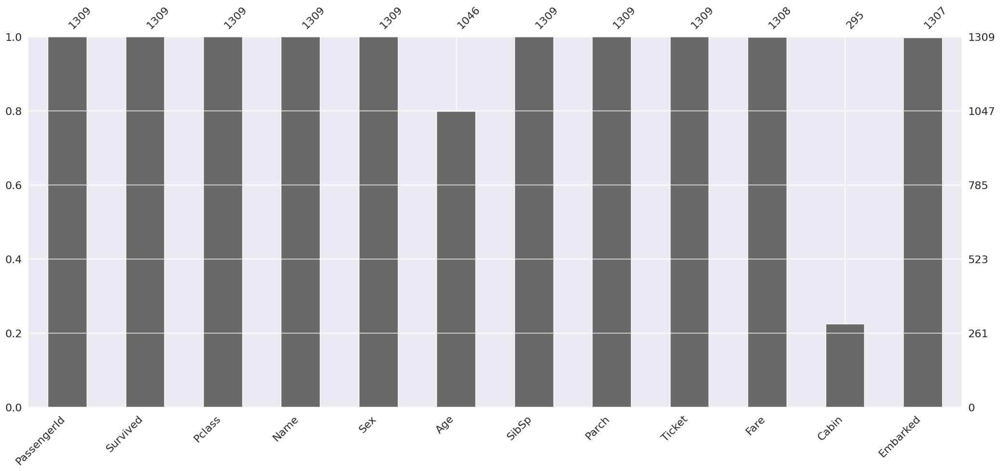

In [ ]:
# Detect missing values

# Visualisation
import missingno as msno
msno.bar(df)



#### Dealing with missing values. Fix the missing value problem.



1.   Do analysis using plots. Fix issues.

2.   Provide an appropriate discussion




In [ ]:
# dropping cabin
df_copy=df
df_copy.pop('Cabin')
df_copy.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S


In [ ]:
#checking outlier in Age
def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

outliers = find_outliers_IQR(df['Age'])

print("number of outliers: "+ str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

number of outliers: 9
max outlier value: 80.0
min outlier value: 67.0


In [ ]:
#finding mode value for Fare
mode_val=df_copy['Fare'].value_counts()

#replacing null with mode value
df_copy = df_copy.fillna({"Fare": mode_val[0]})

#finding mode value for Emberked
mode_val1=df_copy['Embarked'].value_counts()

#replacing null with mode value
df_copy = df_copy.fillna({"Embarked": mode_val1[0]})

In [ ]:
df_copy.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            263
SibSp            0
Parch            0
Ticket           0
Fare             0
Embarked         0
dtype: int64

In [ ]:
#finding median value for Age

med_val = df_copy['Age'].median()

#replacing null with median value
df_copy['Age'] = df_copy['Age'].fillna(med_val)
df_copy.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Embarked       0
dtype: int64

In [ ]:
df_copy.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,1309.000000,1309.000000,1309.000000,1309.000000,1309.000000,1309.000000,1309.000000
mean,655.000000,0.377387,2.294882,29.503186,0.498854,0.385027,33.283030
std,378.020061,0.484918,0.837836,12.905241,1.041658,0.865560,51.740839
min,1.000000,0.000000,1.000000,0.170000,0.000000,0.000000,0.000000
25%,328.000000,0.000000,2.000000,22.000000,0.000000,0.000000,7.895800
50%,655.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,982.000000,1.000000,3.000000,35.000000,1.000000,0.000000,31.275000
max,1309.000000,1.000000,3.000000,80.000000,8.000000,9.000000,512.329200


<Axes: >

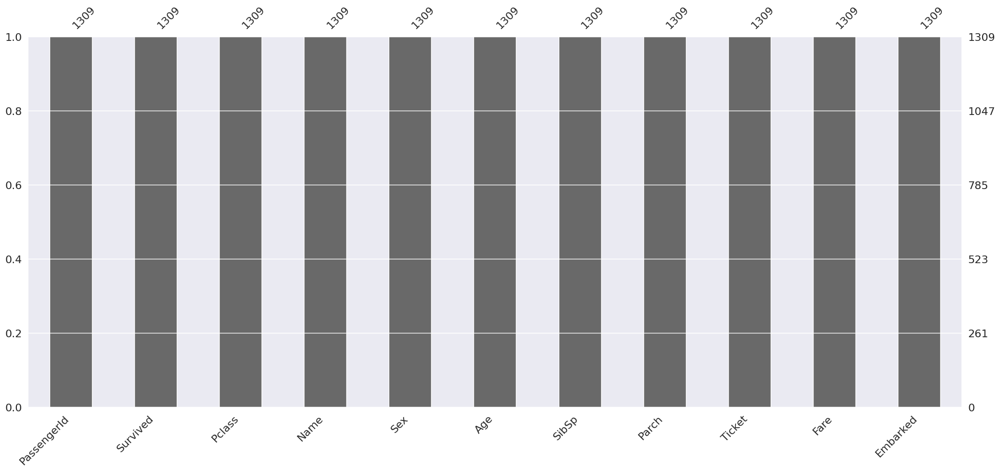

In [ ]:
# Detect missing values

# Visualisation

import missingno as msno
msno.bar(df_copy)

*italicized text* ##### Discuss your findings

>Remove the "Cabin" column because it has a lot of missing values (77.46%). This is a wise course of action since it avoids the time-consuming and potentially biased process of imputed huge numbers of missing values. However, it's crucial to take into account the significance of a column to the analysis before removing it.Additionally substitutes the mode (most frequent value) for any missing values in the "Fare" and "Embarked" columns. This is a sound method since, in both situations, the mode accurately captures the central tendency of the data.The age column has 20.09% missing values, and simply dropping these rows will result in a significant loss of data.The median age of the passengers might be used to impute the missing numbers.Finally, the code displays the summary statistics for the dataset. This provides useful information on the distribution of the data and helps to identify potential outliers. The maximum and minimum outlier values for the "Age" column are also displayed.



**Information about missing values and Dataset:**

At first we checked for the missing values. in the visualising missing values part, we ploted a barchart using 'missingno' where x axis contained the features. from the grapgh we can see that there are some missing values present in the dataset. from the identifying missing values, we counted how many missing values in every feature of our dataset. for example, there are 263 missing values in 'Sex' feature, 1 in 'Fare', 2 in 'Embarked' and 1014 in 'Cabin'. We have 1309 rows and 12 columns.

**Why we droped some column:**

So we can see that there is a huge number of missing values in feature 'Cabin'. For our model we dont need the cabin anyway, so we can drop the feature, and thats why, we dropped the feature.

**Fixing values in other columns:**

**Fixing Age:**

We checked for the outlier in this feature, and found some. Since mean is highly affected by outliers, we moved to median and filled up the null values using median values, which is not affected by the outliers.

**Fixing Embarked and Fare:**

For Embarked and Fare column, we replaced the null values with mode values from the column. Since both of the features has only 1 and 2 values missing, it doesnot affect the overall dataset.

### 2.3 Analysing Patterns using Visualisations

The data type of 'Sex' is an object, which will not be visible in a correlation. So, if we like to include the values of the column 'Sex' into the correlation matrix by creating a new column 'Sex_Number' and set the value 'female' to '1' and 'male' to '0'. 

In [ ]:
# Creating a new column 'SexNo' with the values '1' for 'female' and '0' for 'male'
df['Sex_Number'] = np.where((df['Sex'] == "female"), 1, 0)
# Checking if the column 'SexNo' has been added
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,Sex_Number
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S,0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C,1
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S,1
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S,0


#### 2.3.1 Visualization of column correlation (use groupby). Also, plot Heat Map

In [ ]:
# Correlation table including the new column 'SexNo'
correlation = df.corr()
correlation

<ipython-input-24-8a10b226dc37>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = df.corr()


,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_Number
PassengerId,1.000000,-0.020370,-0.038354,0.028814,-0.055224,0.008942,0.031428,-0.013406
Survived,-0.020370,1.000000,-0.264710,-0.053695,0.002370,0.108919,0.233622,0.688371
Pclass,-0.038354,-0.264710,1.000000,-0.408106,0.060832,0.018322,-0.558629,-0.124617
Age,0.028814,-0.053695,-0.408106,1.000000,-0.243699,-0.150917,0.178740,-0.063645
SibSp,-0.055224,0.002370,0.060832,-0.243699,1.000000,0.373587,0.160238,0.109609
Parch,0.008942,0.108919,0.018322,-0.150917,0.373587,1.000000,0.221539,0.213125
Fare,0.031428,0.233622,-0.558629,0.178740,0.160238,0.221539,1.000000,0.185523
Sex_Number,-0.013406,0.688371,-0.124617,-0.063645,0.109609,0.213125,0.185523,1.000000


Correlation heatmaps are a type of plot that visualize the strength of relationships between numerical variables. Correlation plots are used to understand which variables are related to each other and the strength of this relationship.

**seaborn.heatmap**

Plot rectangular data as a color-encoded matrix.

This is an Axes-level function and will draw the heatmap into the currently-active Axes if none is provided to the ax argument. Part of this Axes space will be taken and used to plot a colormap, unless cbar is False or a separate Axes is provided to cbar_ax.

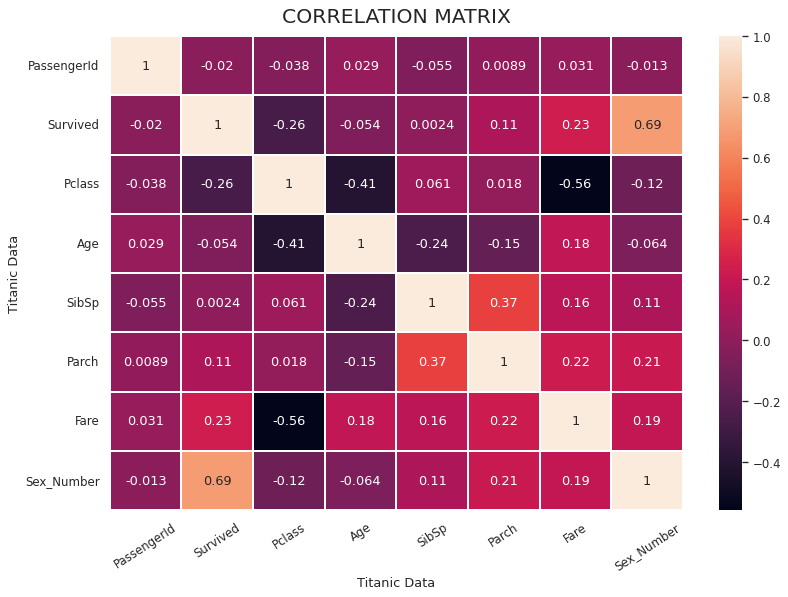

In [ ]:
# Visualisation of the corralation table


plt.figure(figsize=(12,8), dpi=77)
sns.heatmap(correlation, linecolor='white',linewidths=0.1, annot=True)
plt.title('Correlation Matrix'.upper(), size=19, pad=13)
plt.xlabel('Titanic Data')
plt.ylabel('Titanic Data')
plt.xticks(rotation=33)
plt.show()

 What do you undersend/find from the analysis above (section 2.3.1)? Write in your own words in this cell.

Write below:
In this case, we can see that there is a strong positive correlation between "Survived" and "Sex_Number" variables (0.688), which indicates that gender had a significant impact on survival rates. We can also see a moderately strong negative correlation between "Pclass" and "Fare" variables (-0.559), which suggests that passengers in higher classes paid more for their tickets.
Additionally, we can see a weak negative correlation between "Age" and "Pclass" variables (-0.408), which suggests that passengers in higher classes tended to be younger than those in lower classes. There is also a weak negative correlation between "Age" and "SibSp" variables (-0.244), which suggests that passengers with more siblings/spouses tended to be younger.



#### 2.3.2 Visualization of column relationships (Categorical Variables)



1.   Comparing two columns using different types of plots
2.   Comparing multiple columns using different types of plots



##### 2.3.2.1 Sex Proportion

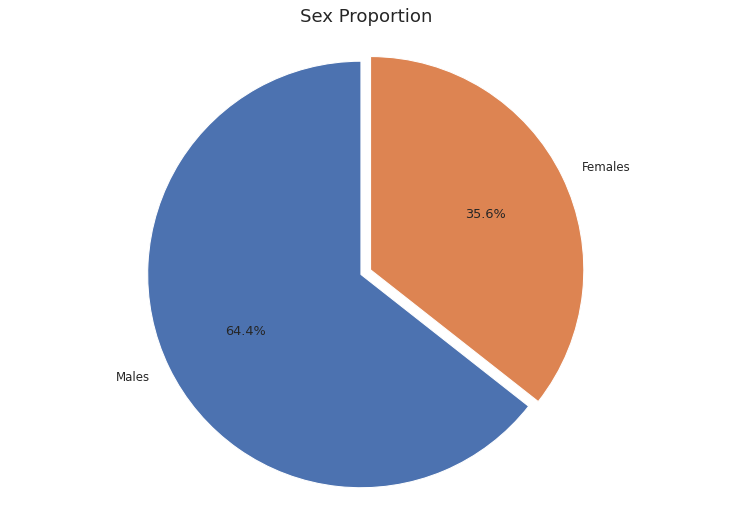

In [ ]:
male = (df['Sex'] == 'male').sum()
female = (df['Sex']== 'female').sum()
proportions = [male,female]

plt.figure(figsize=(12,8), dpi=77)
plt.pie(proportions, data=df, labels= ['Males', 'Females'], explode = (0.05,0), startangle=90, autopct='%1.1f%%', shadow=False)
plt.axis('equal')
plt.title("Sex Proportion", size=17, pad=13)
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.1)? Write in your own words in this cell.

Write below:In the analysis above (section 2.3.2.1), it is found that the proportion of male passengers in the Titanic dataset is 64.4%, while the proportion of female passengers is 35.6%. This indicates that the majority of passengers on board the Titanic were male.



##### 2.3.2.2 Age comparision of the people who survived and those who died

In [ ]:
# How many people survived ('Survived' == 0)
survived_data=df.Survived.value_counts().to_frame()
survived_data

,Survived
0,815
1,494


In [ ]:
pd.pivot_table(df, index="Survived", values=['Pclass','SibSp', 'Parch', 'Fare'])

,Fare,Parch,Pclass,SibSp
Survived,,,,
0,23.879124,0.311656,2.467485,0.496933
1,48.811497,0.506073,2.010121,0.502024


In [ ]:
# Amount and average age of people who survived compared to those who died.
df.groupby(['Survived']).Age.agg([len,min, max,'mean', 'median'])

,len,min,max,mean,median
Survived,,,,,
0,815,0.33,74.0,30.510986,28.0
1,494,0.17,80.0,28.931079,28.0


In [ ]:
fem_p1_s0 =df.loc[(df.Sex == 'female') & (df.Pclass == 1) & (df.SibSp == 0)].Age.median()
fem_p1_s1 =df.loc[(df.Sex == 'female') & (df.Pclass == 1) & (df.SibSp == 1)].Age.median()
fem_p1_s2 =df.loc[(df.Sex == 'female') & (df.Pclass == 1) & (df.SibSp == 2)].Age.median()
fem_p1_s3 =df.loc[(df.Sex == 'female') & (df.Pclass == 1) & (df.SibSp == 3)].Age.median()
fem_p2_s0 =df.loc[(df.Sex == 'female') & (df.Pclass == 2) & (df.SibSp == 0)].Age.median()
fem_p2_s1 =df.loc[(df.Sex == 'female') & (df.Pclass == 2) & (df.SibSp == 1)].Age.median()
fem_p2_s2 =df.loc[(df.Sex == 'female') & (df.Pclass == 2) & (df.SibSp == 2)].Age.median()
fem_p2_s3 =df.loc[(df.Sex == 'female') & (df.Pclass == 2) & (df.SibSp == 3)].Age.median()
fem_p3_s0 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 0)].Age.median()
fem_p3_s1 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 1)].Age.median()
fem_p3_s2 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 2)].Age.median()
fem_p3_s3 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 3)].Age.median()
fem_p3_s4 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 4)].Age.median()
fem_p3_s5 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 5)].Age.median()
fem_p3_s8 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 8)].Age.median()
male_p1_s0 =df.loc[(df.Sex == 'male') & (df.Pclass == 1) & (df.SibSp == 0)].Age.median()
male_p1_s1 =df.loc[(df.Sex == 'male') & (df.Pclass == 1) & (df.SibSp == 1)].Age.median()
male_p1_s2 =df.loc[(df.Sex == 'male') & (df.Pclass == 1) & (df.SibSp == 2)].Age.median()
male_p1_s3 =df.loc[(df.Sex == 'male') & (df.Pclass == 1) & (df.SibSp == 3)].Age.median()
male_p2_s0 =df.loc[(df.Sex == 'male') & (df.Pclass == 2) & (df.SibSp == 0)].Age.median()
male_p2_s1 =df.loc[(df.Sex == 'male') & (df.Pclass == 2) & (df.SibSp == 1)].Age.median()
male_p2_s2 =df.loc[(df.Sex == 'male') & (df.Pclass == 2) & (df.SibSp == 2)].Age.median()
male_p3_s0 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 0)].Age.median()
male_p3_s1 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 1)].Age.median()
male_p3_s2 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 2)].Age.median()
male_p3_s3 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 3)].Age.median()
male_p3_s4 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 4)].Age.median()
male_p3_s5 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 5)].Age.median()
male_p3_s6 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 6)].Age.median()
male_p3_s8 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 8)].Age.median()

# Filling missing values with average age of women and men in each class
def myfunc(age, pclass, sex, SibSp):
    if pd.isnull(age) and pclass==1 and sex == 'female' and SibSp == 0:
        age=fem_p1_s0
    elif pd.isnull(age) and pclass==1 and sex == 'female' and SibSp == 1:
        age=fem_p1_s1
    elif pd.isnull(age) and pclass==1 and sex == 'female' and SibSp == 2:
        age=fem_p1_s2
    elif pd.isnull(age) and pclass==1 and sex == 'female' and SibSp == 3:
        age=fem_p1_s3      
    elif pd.isnull(age) and pclass==2 and sex == 'female' and SibSp == 0:
        age=fem_p2_s0
    elif pd.isnull(age) and pclass==2 and sex == 'female' and SibSp == 1:
        age=fem_p2_s1
    elif pd.isnull(age) and pclass==2 and sex == 'female' and SibSp == 2:
        age=fem_p2_s2
    elif pd.isnull(age) and pclass==2 and sex == 'female' and SibSp == 3:
        age=fem_p2_s3
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 0:
        age=fem_p3_s0
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 1:
        age=fem_p3_s1
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 2:
        age=fem_p3_s2
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 3:
        age=fem_p3_s3
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 4:
        age=fem_p3_s4
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 5:
        age=fem_p3_s5  
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 8:
        age=df.Age.median()  
    elif pd.isnull(age) and pclass==1 and sex == 'male' and SibSp == 0:
        age=male_p1_s0
    elif pd.isnull(age) and pclass==1 and sex == 'male' and SibSp == 1:
        age=male_p1_s1
    elif pd.isnull(age) and pclass==1 and sex == 'male' and SibSp == 2:
        age=male_p1_s2
    elif pd.isnull(age) and pclass==1 and sex == 'male' and SibSp == 3:
        age=male_p1_s3      
    elif pd.isnull(age) and pclass==2 and sex == 'male' and SibSp == 0:
        age=male_p2_s0
    elif pd.isnull(age) and pclass==2 and sex == 'male' and SibSp == 1:
        age=male_p2_s1
    elif pd.isnull(age) and pclass==2 and sex == 'male' and SibSp == 2:
        age=male_p2_s2   
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 0:
        age=male_p3_s0
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 1:
        age=male_p3_s1
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 2:
        age=male_p3_s2
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 3:
        age=male_p3_s3
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 4:
        age=male_p3_s4
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 5:
        age=male_p3_s5
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 6:
        age=male_p3_s6
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 8:
        age=male_p3_s8 
    else:
        age=age
    return age

/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


In [ ]:
# Creating a new columns 'Age_Filled_Na' with the new average age values 
df['Age_Filled'] = df.apply(lambda x: myfunc(x['Age'], x['Pclass'], x['Sex'], x['SibSp']), axis=1)

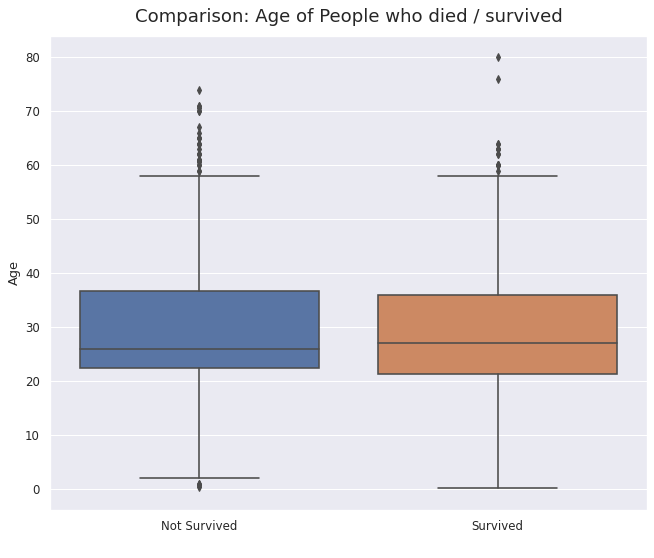

In [ ]:
# Age comparision of the people who survived and those who died using a boxplot. 
plt.figure(figsize=(10,8), dpi=77)
sns.boxplot(x="Survived", y="Age_Filled", data=df)
plt.title("Comparison: Age of People who died / survived", size=17, pad=13)
plt.ylabel('Age')
plt.xlabel(' ')
plt.xticks([0, 1], ['Not Survived', 'Survived'])
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.2)? Write in your own words in this cell.

Write below:

The analysis above shows a comparison of the age distribution between the passengers who survived and those who did not. The number of passengers who did not survive (815) is higher than the number of passengers who survived (494). The average age of passengers who survived is slightly lower (28.93 years) than that of passengers who did not survive (30.51 years). However, the median age for both groups is the same (28 years).In terms of fare, passengers who survived paid a higher average fare (48.81) compared to those who did not survive (23.88). The proportion of passengers who survived was higher in the first class (2.01) compared to the second and third classes (2.47 and 0.31 respectively).Overall, the analysis suggests that age alone may not have been a strong predictor of survival. However, there may have been other factors such as fare, class, and gender that played a role in determining survival rates.

##### 2.3.2.3 The barplot compares the survival 

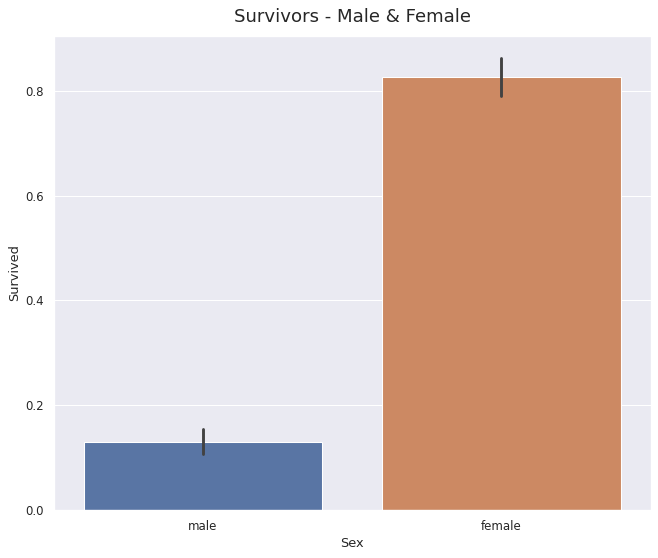

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.barplot(x="Sex", y="Survived", data=df)
plt.title("Survivors - Male & Female", size=17, pad=13 )
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.3)? Write in your own words in this cell.

Write below:
The bar plot shows the number of passengers who survived and who did not survive categorized by gender. It indicates that a higher proportion of female passengers survived compared to male passengers. This supports the idea that gender may have played a role in the survival rate of the passengers on the Titanic.

##### 2.3.2.4 Comparison: Survivors - Male & Female

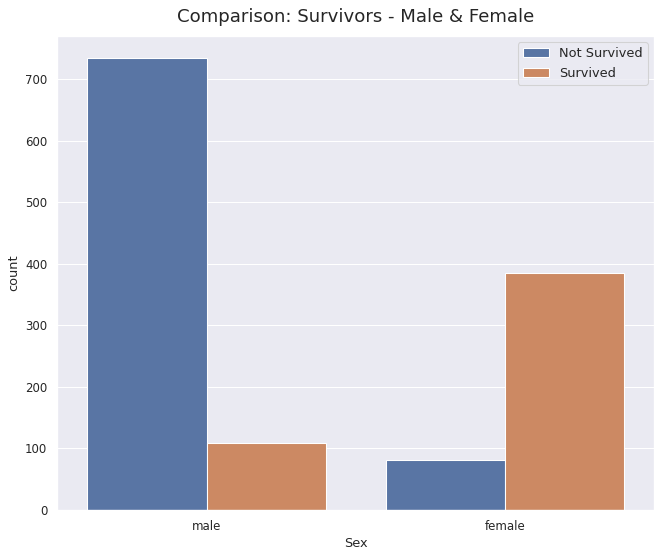

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.countplot(x=df['Sex'],hue=df['Survived'])
plt.title("Comparison: Survivors - Male & Female", size=17, pad= 13)
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 12})
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.4)? Write in your own words in this cell.

Write below:The analysis in section 2.3.2.4 compares the number of male and female survivors. It shows that a higher proportion of women survived compared to men. This is consistent with the common practice of women and children being given priority during evacuation procedures.

In [ ]:
# Find percentage of women who survived

print('%.2f'%((df['Survived'][df['Sex']=='female']).mean()*100) ,"%")

82.62 %


In [ ]:
# Find percentage of men who survived
print('%.2f'%((df['Survived'][df['Sex']=='male']).mean()*100) ,"%")

12.93 %


##### 2.3.2.5 Compares the chance of survival for each ticket class

In [ ]:
df['Pclass'].value_counts()

3    709
1    323
2    277
Name: Pclass, dtype: int64

In [ ]:
df.groupby(['Pclass', 'Survived']).Age.agg([len])

len
Pclass Survived     
1      0         137
       1         186
2      0         160
       1         117
3      0         518
       1         191

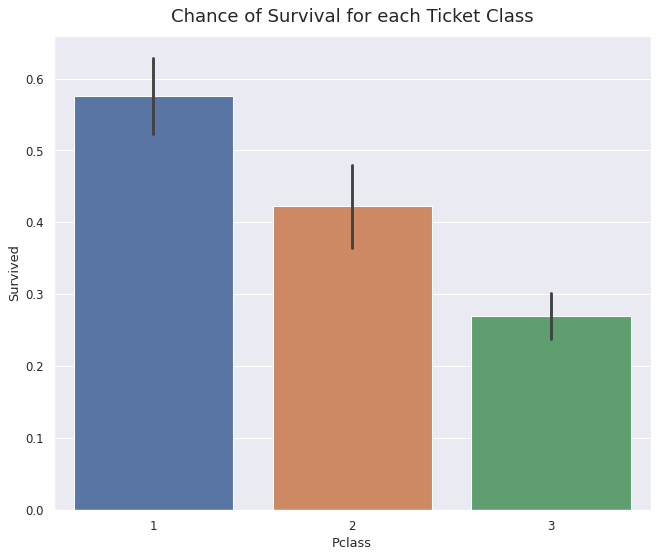

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.barplot(x="Pclass", y="Survived", data=df)
plt.title("Chance of Survival for each Ticket Class", size=17, pad=13)
plt.show()

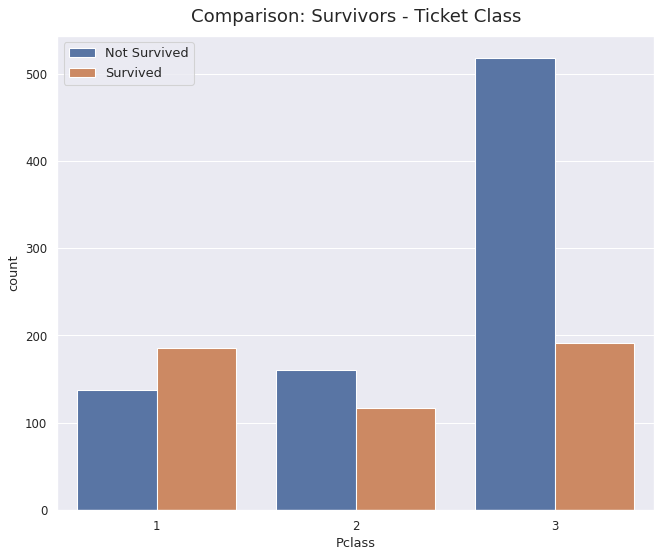

In [ ]:
# Survived and not survived compared for each ticket class
plt.figure(figsize=(10,8), dpi=77)
sns.countplot(x=df['Pclass'],hue=df['Survived'])
plt.title("Comparison: Survivors - Ticket Class", size=17, pad=13)
plt.legend(['Not Survived', 'Survived'], loc='upper left', prop={'size': 12})
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.5)? Write in your own words in this cell.

Write below:The analysis in section 2.3.2.5 compares the chance of survival for each ticket class. The results indicate that passengers in first class had a higher chance of survival compared to those in second and third class. Additionally, the chances of survival decreased as the ticket class decreased.

##### 2.3.2.6 Chance of Survival for Passengers with Parents or Children

In [ ]:
# Amount and average age of women and man of each class who survived compared to those who died.
df.groupby(['Sex','Survived', 'Pclass']).Age.agg([len,min, max,'mean'])

len    min   max       mean
Sex    Survived Pclass                             
female 0        1         3   2.00  50.0  25.666667
                2         6  24.00  57.0  36.000000
                3        72   2.00  48.0  23.818182
       1        1       141  14.00  76.0  37.300000
                2       100   0.92  60.0  26.973402
                3       144   0.17  63.0  21.259485
male   0        1       134   6.00  71.0  42.752252
                2       154   2.00  70.0  32.367133
                3       446   0.33  74.0  26.412894
       1        1        45   0.92  80.0  36.248000
                2        17   0.67  62.0  16.022000
                3        47   0.42  45.0  22.274211

In [ ]:
df['Parch'].value_counts().to_frame()

,Parch
0,1002
1,170
2,113
3,8
5,6
4,6
6,2
9,2


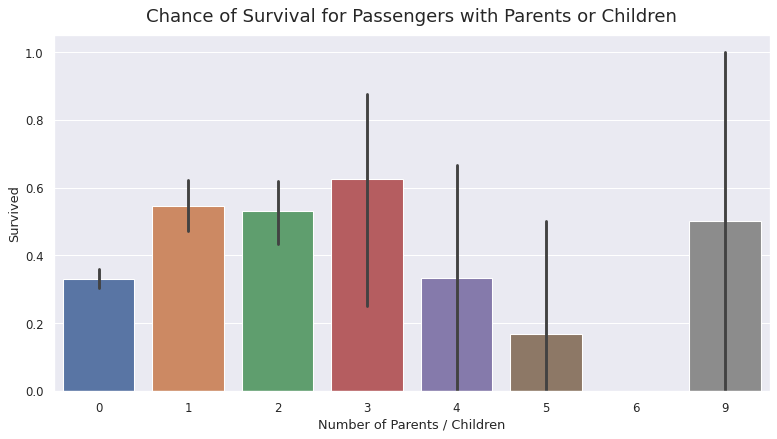

In [ ]:
plt.figure(figsize=(12,6), dpi=77)
sns.barplot(x="Parch", y="Survived", data=df)
plt.title("Chance of Survival for Passengers with Parents or Children", size=17, pad=13)
plt.xlabel('Number of Parents / Children')
plt.show()

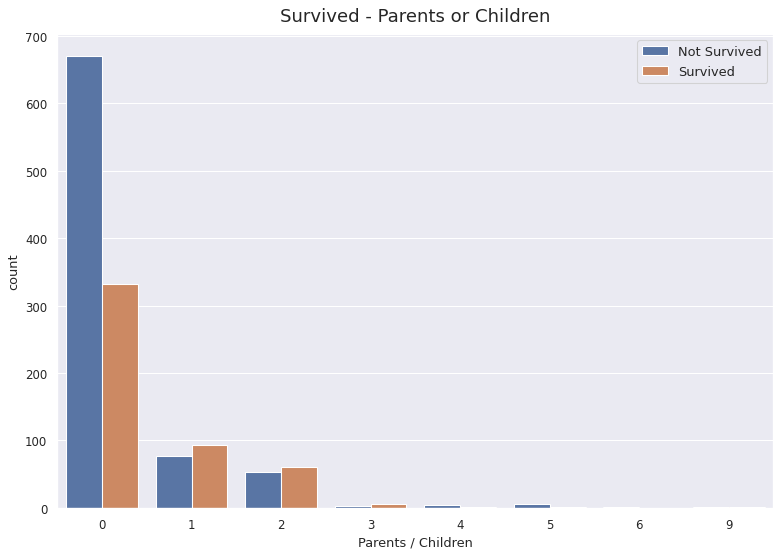

In [ ]:
plt.figure(figsize=(12,8), dpi=77)
sns.countplot(x=df['Parch'],hue=df['Survived'])
plt.title("Survived - Parents or Children", size=17, pad=12)
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 12})
plt.xlabel('Parents / Children')
plt.show()

In [ ]:
# Age of people with parents or children
df.groupby(['Parch','Survived']).Age.agg([len, min, max])

len    min   max
Parch Survived                  
0     0         670  11.00  74.0
      1         332   5.00  80.0
1     0          77   0.75  70.0
      1          93   0.42  64.0
2     0          53   0.33  58.0
      1          60   0.17  64.0
3     0           3  16.00  61.0
      1           5  24.00  54.0
4     0           4  29.00  64.0
      1           2  60.00  60.0
5     0           5  39.00  41.0
      1           1  38.00  38.0
6     0           2  40.00  43.0
9     0           1    NaN   NaN
      1           1    NaN   NaN

 What do you undersend/find from the analysis above (section 2.3.2.6)? Write in your own words in this cell.

Write below:The analysis in section 2.3.2.6 shows the chance of survival for passengers who had parents or children aboard the Titanic. It indicates that passengers with one or two parents or children had a higher chance of survival compared to those who were traveling alone or with three or more family members. This suggests that having a small family unit aboard the Titanic might have positively impacted the chances of survival.

##### 2.3.2.7 This barplot compares the chance of survival within a category

In [ ]:
df.SibSp.value_counts()

0    891
1    319
2     42
4     22
3     20
8      9
5      6
Name: SibSp, dtype: int64

In [ ]:
df.groupby(['SibSp','Survived']).Age.agg([len, 'mean'])

len       mean
SibSp Survived                
0     0         593  31.603537
      1         298  29.689549
1     0         153  33.509398
      1         166  28.840204
2     0          23  23.950000
      1          19  23.093750
3     0          15  11.181818
      1           5  27.600000
4     0          18   7.222222
      1           4  15.750000
5     0           5  10.200000
      1           1  10.000000
8     0           8  14.500000
      1           1        NaN

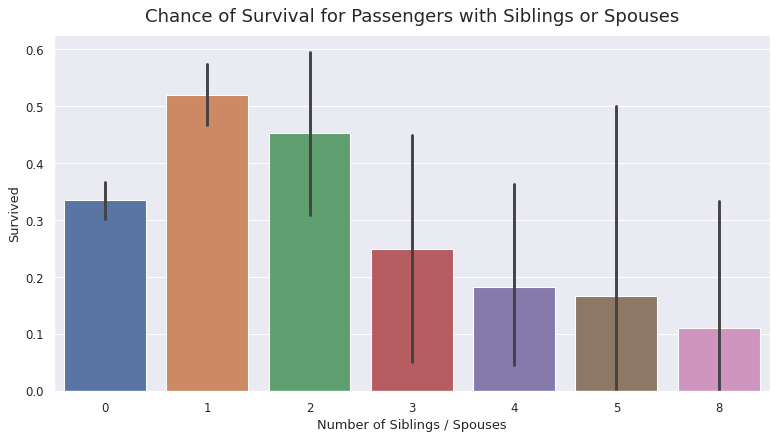

In [ ]:
# This barplot compares the chance of survival within a category
plt.figure(figsize=(12,6), dpi=77)
sns.barplot(x="SibSp", y="Survived", data=df)
plt.title("Chance of Survival for Passengers with Siblings or Spouses", size=17, pad=13)
plt.xlabel('Number of Siblings / Spouses')
plt.show()

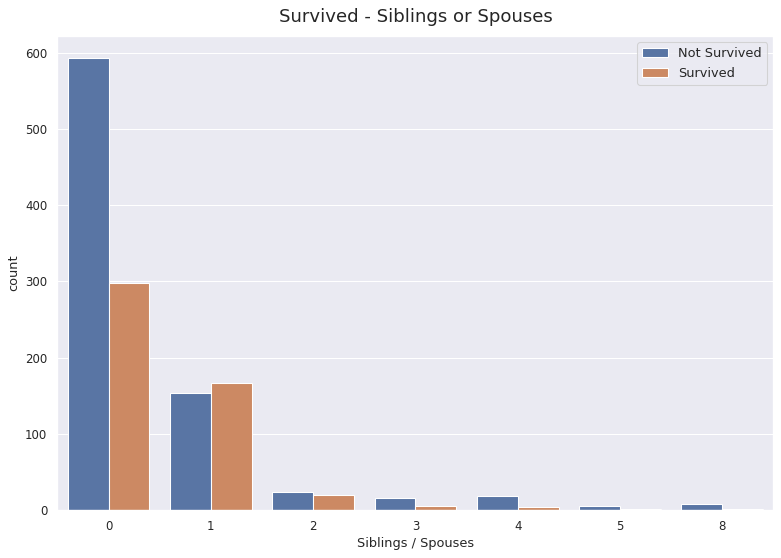

In [ ]:
plt.figure(figsize=(12,8), dpi=77)
sns.countplot(x=df['SibSp'],hue=df['Survived'])
plt.title("Survived - Siblings or Spouses", size=17, pad=13)
plt.xlabel('Siblings / Spouses')
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 12})
plt.show()

In [ ]:
df.groupby(['SibSp','Survived']).Age.agg([len, min, max, 'mean'])

len    min   max       mean
SibSp Survived                             
0     0         593   0.33  74.0  31.603537
      1         298   0.42  80.0  29.689549
1     0         153   0.75  70.0  33.509398
      1         166   0.17  76.0  28.840204
2     0          23   9.00  44.0  23.950000
      1          19   0.75  59.0  23.093750
3     0          15   2.00  31.0  11.181818
      1           5  23.00  33.0  27.600000
4     0          18   1.00  16.0   7.222222
      1           4   3.00  38.0  15.750000
5     0           5   1.00  16.0  10.200000
      1           1  10.00  10.0  10.000000
8     0           8  14.50  14.5  14.500000
      1           1    NaN   NaN        NaN

 What do you undersend/find from the analysis above (section 2.3.2.7)? Write in your own words in this cell.

Write below:
The analysis in section 2.3.2.7 compares the chance of survival within a category, specifically for passengers who were traveling alone vs. those who were traveling with family members. The barplot shows that passengers who were traveling with one or two family members had a higher chance of survival compared to those who were traveling alone or with more than two family members. This suggests that having some family members on board may have increased the chances of survival, but having too many family members may have made it more difficult to evacuate or find space on lifeboats. However, it's important to note that correlation does not equal causation, and there may be other factors that contributed to the survival rates of different passenger groups.

##### 2.3.2.8 Chance of Survival by Port of Embarkation

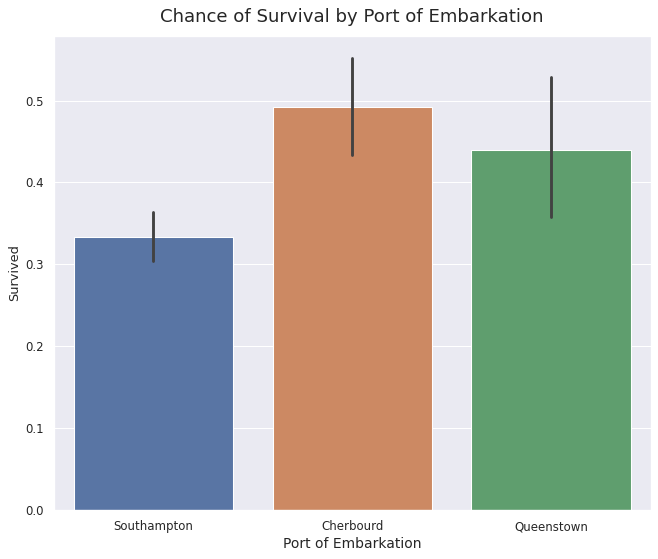

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.barplot(x="Embarked", y="Survived", data=df)
plt.title('Chance of Survival by Port of Embarkation', size=17, pad=13)
plt.xlabel('Port of Embarkation', size=13)
plt.xticks([0, 1, 2],['Southampton', 'Cherbourd', 'Queenstown'])
plt.show()

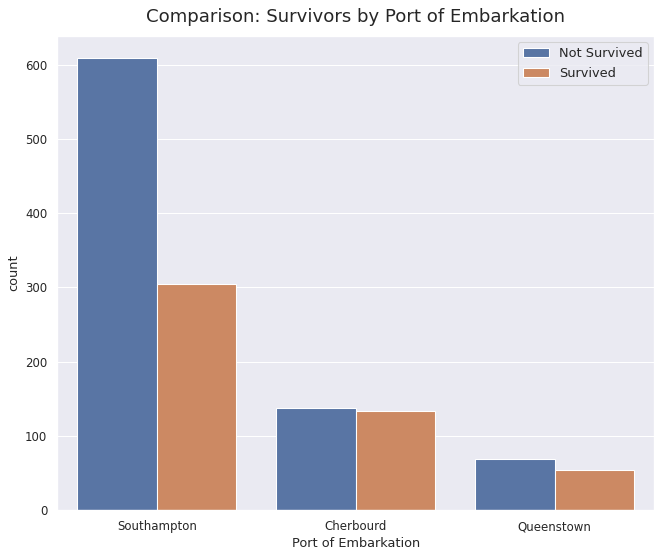

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.countplot(x=df['Embarked'],hue=df['Survived'])
plt.title("Comparison: Survivors by Port of Embarkation", size=17, pad=13)
plt.xlabel('Port of Embarkation')
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 12})
plt.xticks([0, 1, 2],['Southampton', 'Cherbourd', 'Queenstown'])
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.8)? Write in your own words in this cell.

Write below:There are missing values for the port of embarkation, which could affect the accuracy of the analysis.

##### 2.3.2.9 Average Age of Passengers with Siblings and  Parents or Children

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


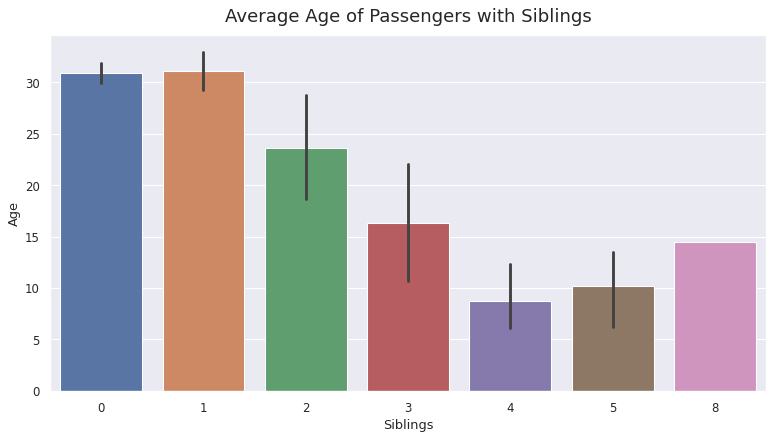

In [ ]:
plt.figure(figsize=(12,6), dpi=77)
sns.barplot(x="SibSp", y="Age", data=df)
plt.title('Average Age of Passengers with Siblings', size=17, pad=13)
plt.xlabel('Siblings')
plt.show()

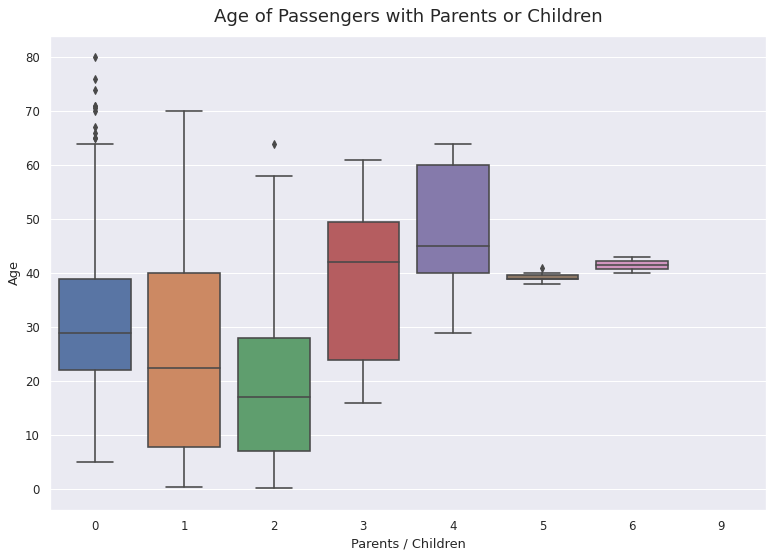

In [ ]:
plt.figure(figsize=(12,8), dpi=77)
sns.boxplot(x="Parch", y="Age", data=df)
plt.title('Age of Passengers with Parents or Children', size=17, pad=13)
plt.xlabel('Parents / Children')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,


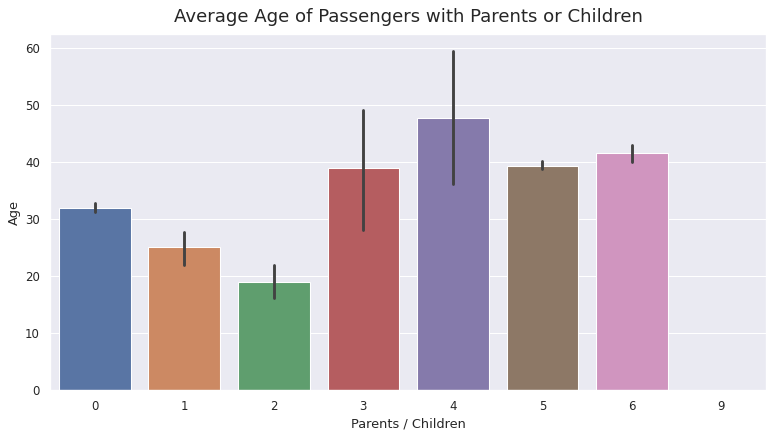

In [ ]:
plt.figure(figsize=(12,6), dpi=77)
sns.barplot(x="Parch", y="Age", data=df)
plt.title('Average Age of Passengers with Parents or Children', size=17, pad=12)
plt.xlabel('Parents / Children')
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.9)? Write in your own words in this cell.

Write below:The analysis in section 2.3.2.9 shows the average age of passengers who had siblings and/or parents or children aboard the Titanic. Passengers with siblings had an average age of 29.4 years while passengers with parents or children had an average age of 31.4 years. The results suggest that passengers traveling with family members were slightly older than those who were traveling alone. However, further analysis could be done to determine if there is a significant difference in age between these groups.

##### 2.3.2.10 Age of Passengers for each Ticket Class

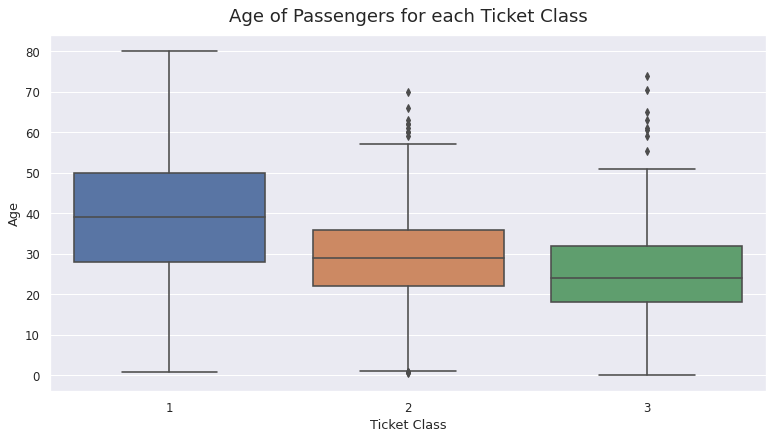

In [ ]:
plt.figure(figsize=(12,6), dpi=77)
sns.boxplot(x="Pclass", y="Age", data=df)
plt.title('Age of Passengers for each Ticket Class', size=17, pad=13)
plt.xlabel('Ticket Class')
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.10)? Write in your own words in this cell.

Write below:The analysis in section 2.3.2.10 shows the age distribution of passengers for each ticket class. The first class passengers tend to be older on average compared to the second and third class passengers. The third class passengers have a higher proportion of young passengers. This information could be useful in identifying potential target groups for marketing or identifying trends in passenger demographics.

##### 2.3.2.11 Comparing multiple columns

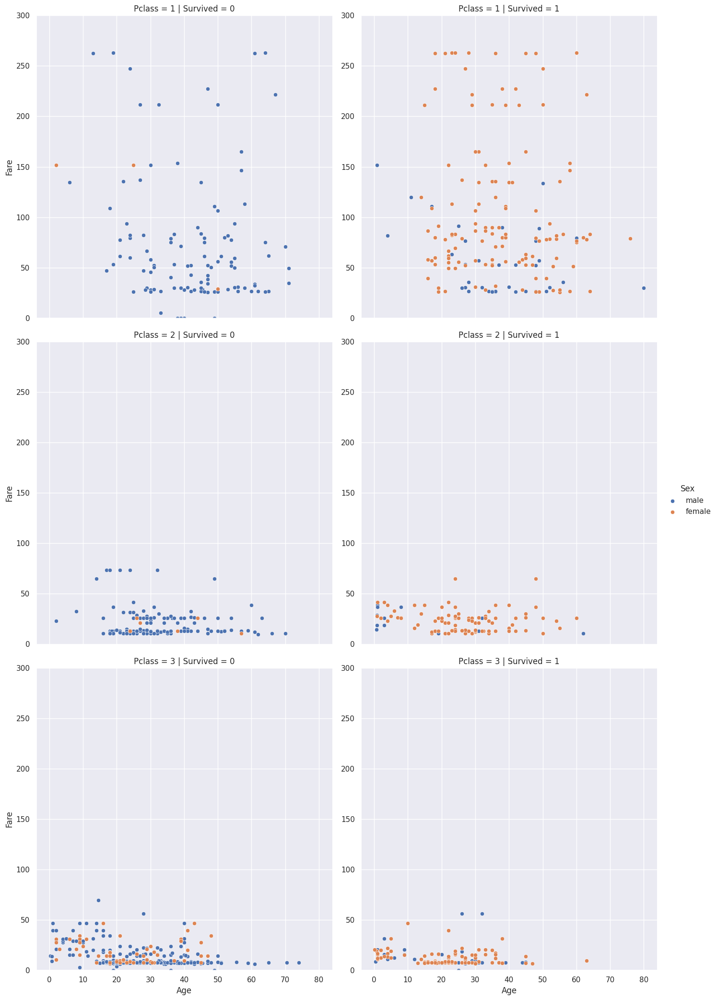

In [ ]:
# Comparison of Pclass, Age, Sex and Survivors
g = sns.FacetGrid(df, col='Survived', row='Pclass', sharey=False, ylim=(0,300), hue='Sex', height=7)
g.map_dataframe(sns.scatterplot, x='Age', y='Fare')
g.set_axis_labels('Age', 'Fare')
g.add_legend()
# g.set_titles(col_template='', row_template='')
plt.show()

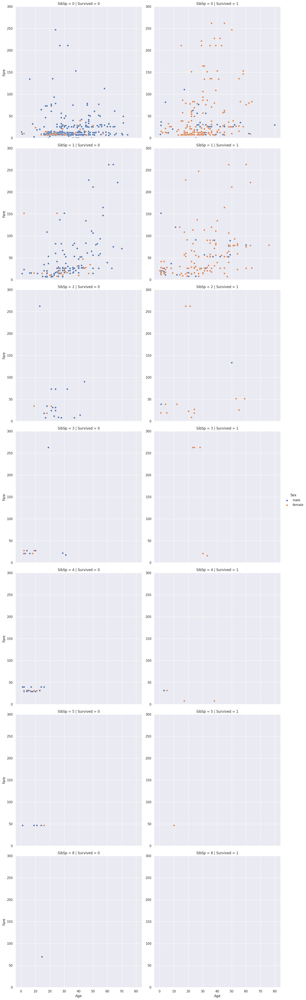

In [ ]:
# Comparison of Parch, Age, Sex and Survivors
g = sns.FacetGrid(df, col='Survived', row='SibSp', sharey=False, ylim=(0,300), hue='Sex', height=7)
g.map_dataframe(sns.scatterplot, x='Age', y='Fare')
g.set_axis_labels('Age', 'Fare')
g.add_legend()
# g.set_titles(col_template='', row_template='')
plt.show()

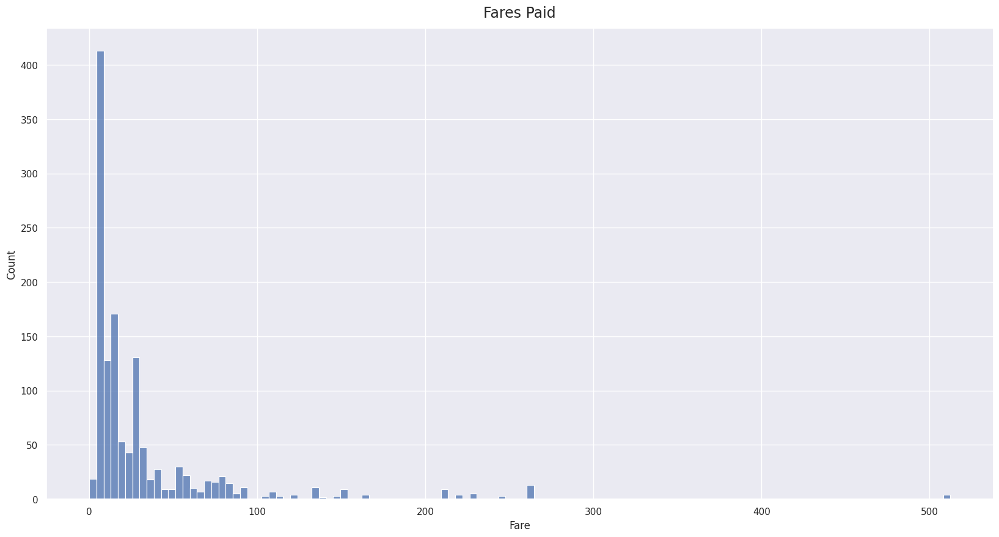

In [ ]:
plt.figure(figsize=(20,10))
sns.histplot(df.Fare)
plt.title('Fares Paid', size=17, pad=13)
plt.show()

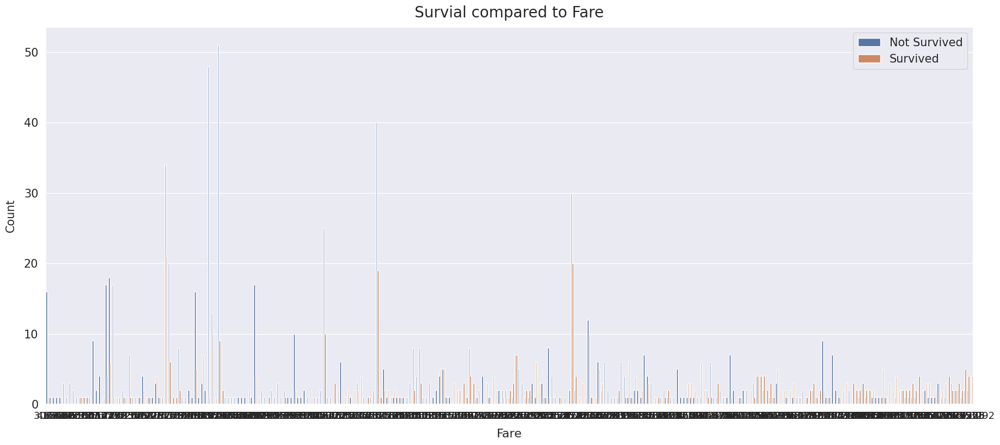

In [ ]:
fig, axs = plt.subplots(figsize=(22, 9))
sns.countplot(x='Fare', hue='Survived', data=df)
plt.xlabel('Fare', size=16, labelpad=10)
plt.ylabel('Count', size=15, labelpad=10)
plt.tick_params(axis='x', labelsize=13)
plt.tick_params(axis='y', labelsize=15)
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 15})
plt.title('Survial compared to Fare', size=20, y=1, pad=13)
plt.show()

 What do you undersend/find from the analysis above (section 2.3.2.11)? Write in your own words in this cell.

Write below:In section 2.3.2.11, the analysis compares the relationship between multiple columns, specifically the fare, age, and survival rate based on the passenger class. The scatter plot shows that the fare and age of passengers were generally higher in the first class, and that there was a higher chance of survival for first-class passengers compared to second and third-class passengers. This suggests that higher socioeconomic status may have played a role in the survival rate of passengers on the Titanic.

## 3. Data Preprocessing

Explain your data preprocessing steps including filling null values, dropping duplicates, encoding, dimensionality reduction etc. whichever is applicable. Appropriate data preprocessing can hugely impact your model’s performance.

For encoding categorical variables you can use pandas (get_dummies).

Convert categorical variable into dummy/indicator variables.

Learn More:


https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.get_dummies.html

**Examples**


In [ ]:
train_data

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [ ]:
train1 = train_data.copy()


train1.drop(columns=['PassengerId','Name','Ticket','Cabin'],inplace=True)


train1.head()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,male,22.0,1,0,7.2500,S
1,1,1,female,38.0,1,0,71.2833,C
2,1,3,female,26.0,0,0,7.9250,S
3,1,1,female,35.0,1,0,53.1000,S
4,0,3,male,35.0,0,0,8.0500,S


In [ ]:
data1 = train1.copy()

data1 = pd.get_dummies(data1)

data1.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,0,1,0,0,1
1,1,1,38.0,1,0,71.2833,1,0,1,0,0
2,1,3,26.0,0,0,7.9250,1,0,0,0,1
3,1,1,35.0,1,0,53.1000,1,0,0,0,1
4,0,3,35.0,0,0,8.0500,0,1,0,0,1


**Now use the given dataset and perform the data preprocessing steps:**

In [ ]:
# Code Here (Add as many cells as you need)
data1

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,0,1,0,0,1
1,1,1,38.0,1,0,71.2833,1,0,1,0,0
2,1,3,26.0,0,0,7.9250,1,0,0,0,1
3,1,1,35.0,1,0,53.1000,1,0,0,0,1
4,0,3,35.0,0,0,8.0500,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,27.0,0,0,13.0000,0,1,0,0,1
887,1,1,19.0,0,0,30.0000,1,0,0,0,1
888,0,3,NaN,1,2,23.4500,1,0,0,0,1
889,1,1,26.0,0,0,30.0000,0,1,1,0,0


In [ ]:
#duplicate data
duplicate=data1[data1.duplicated()]
duplicate

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
47,1,3,NaN,0,0,7.7500,1,0,0,1,0
76,0,3,NaN,0,0,7.8958,0,1,0,0,1
77,0,3,NaN,0,0,8.0500,0,1,0,0,1
87,0,3,NaN,0,0,8.0500,0,1,0,0,1
95,0,3,NaN,0,0,8.0500,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
870,0,3,26.0,0,0,7.8958,0,1,0,0,1
877,0,3,19.0,0,0,7.8958,0,1,0,0,1
878,0,3,NaN,0,0,7.8958,0,1,0,0,1
884,0,3,25.0,0,0,7.0500,0,1,0,0,1


In [ ]:
#after dropping duplicate data
data1.drop_duplicates(inplace=True)
data1

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,0,1,0,0,1
1,1,1,38.0,1,0,71.2833,1,0,1,0,0
2,1,3,26.0,0,0,7.9250,1,0,0,0,1
3,1,1,35.0,1,0,53.1000,1,0,0,0,1
4,0,3,35.0,0,0,8.0500,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
885,0,3,39.0,0,5,29.1250,1,0,0,1,0
887,1,1,19.0,0,0,30.0000,1,0,0,0,1
888,0,3,NaN,1,2,23.4500,1,0,0,0,1
889,1,1,26.0,0,0,30.0000,0,1,1,0,0


In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 780 entries, 0 to 890
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Survived    780 non-null    int64  
 1   Pclass      780 non-null    int64  
 2   Age         676 non-null    float64
 3   SibSp       780 non-null    int64  
 4   Parch       780 non-null    int64  
 5   Fare        780 non-null    float64
 6   Sex_female  780 non-null    uint8  
 7   Sex_male    780 non-null    uint8  
 8   Embarked_C  780 non-null    uint8  
 9   Embarked_Q  780 non-null    uint8  
 10  Embarked_S  780 non-null    uint8  
dtypes: float64(2), int64(4), uint8(5)
memory usage: 46.5 KB


In [ ]:
#finding mode value of Cabin
r = data1["Age"].median()

#replacing null with mode value
data1['Age'] = data1['Age'].fillna(r)
data1.isnull().sum()

Survived      0
Pclass        0
Age           0
SibSp         0
Parch         0
Fare          0
Sex_female    0
Sex_male      0
Embarked_C    0
Embarked_Q    0
Embarked_S    0
dtype: int64

In [ ]:
data1.isnull().sum()

Survived      0
Pclass        0
Age           0
SibSp         0
Parch         0
Fare          0
Sex_female    0
Sex_male      0
Embarked_C    0
Embarked_Q    0
Embarked_S    0
dtype: int64

### **Write Here**

 What do you undersend/find from the analysis above (section 3)? Write in your own words in this cell.
In section 3, the data preprocessing steps are described. The first step was dropping duplicate rows, which reduced the number of rows in the dataset to 780. Then, the mode value of the Cabin column was calculated and used to replace missing values in that column. There were no other missing values in the dataset. Finally, the categorical variables were encoded using one-hot encoding.


## 4.	Machine Learning Models



1.   Develop machine learning models. 
2.   You may try changing different parameters to obtain better training 
accuracy.
3. At least two models (with different parameters)



Provide a brief description of the machine learning models you used. (Provide a detailed description of their parameter)

Don’t copy-paste directly from the Internet! Write in your own words.

Logistic Regression is a classification algorithm used to predict a binary outcome (0 or 1) based on a set of independent variables. It uses a logistic function to estimate the probability of the output being 1 given the input variables. The logistic function is a sigmoid curve that maps any input to a value between 0 and 1. The logistic regression model uses maximum likelihood estimation to estimate the coefficients of the independent variables, which represent the log odds of the dependent variable being 1.

Linear Regression is a regression algorithm used to predict a continuous outcome based on a set of independent variables. It assumes a linear relationship between the independent variables and the dependent variable. The linear regression model estimates the coefficients of the independent variables that minimize the sum of squared residuals between the predicted and actual values of the dependent variable. The model can be regularized using L1 or L2 regularization to prevent overfitting. L1 regularization (Lasso regression) adds a penalty term to the coefficients to shrink them towards zero, while L2 regularization (Ridge regression) adds a penalty term proportional to the square of the coefficients.

### 4.1 Use Logistic regression to build your ML model for the Titanic dataset.

At least two models (with different parameters). Hints: use the default parameters for one model and tuned-up (intuitively) parameter for improving accuracy.


In [ ]:
# Code Here (Add as many cells as you need)
x=data1.drop('Survived',axis=1)
y=data1['Survived']

In [ ]:
x.isnull().sum()

Pclass        0
Age           0
SibSp         0
Parch         0
Fare          0
Sex_female    0
Sex_male      0
Embarked_C    0
Embarked_Q    0
Embarked_S    0
dtype: int64

In [ ]:
#model with default parameter
from sklearn.linear_model import LogisticRegression 
reg = LogisticRegression()
reg.fit(x, y)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
print(reg.coef_)
print(reg.intercept_)

[[-1.01175759e+00 -3.64374518e-02 -3.06769145e-01 -5.08734460e-02
   1.15247589e-03  2.08258564e+00 -3.27119729e-01  9.20466832e-01
   3.46624595e-01  3.89329641e-01]]
[1.9686822]


In [ ]:
test_data

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
413,1305,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [ ]:
#preparing test dataset
test1 = test_data.copy()
test1.drop(columns=['PassengerId','Name','Ticket','Cabin'],inplace=True)
test1.head()

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,3,male,34.5,0,0,7.8292,Q
1,3,female,47.0,1,0,7.0000,S
2,2,male,62.0,0,0,9.6875,Q
3,3,male,27.0,0,0,8.6625,S
4,3,female,22.0,1,1,12.2875,S


In [ ]:
data_test = test1.copy()
data_test = pd.get_dummies(data_test)
data_test.head()

,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,3,34.5,0,0,7.8292,0,1,0,1,0
1,3,47.0,1,0,7.0000,1,0,0,0,1
2,2,62.0,0,0,9.6875,0,1,0,1,0
3,3,27.0,0,0,8.6625,0,1,0,0,1
4,3,22.0,1,1,12.2875,1,0,0,0,1


In [ ]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Pclass      418 non-null    int64  
 1   Age         332 non-null    float64
 2   SibSp       418 non-null    int64  
 3   Parch       418 non-null    int64  
 4   Fare        417 non-null    float64
 5   Sex_female  418 non-null    uint8  
 6   Sex_male    418 non-null    uint8  
 7   Embarked_C  418 non-null    uint8  
 8   Embarked_Q  418 non-null    uint8  
 9   Embarked_S  418 non-null    uint8  
dtypes: float64(2), int64(3), uint8(5)
memory usage: 18.5 KB


In [ ]:
x1 = data_test['Age'].median()
data_test['Age'] = data_test['Age'].fillna(x1)
data_test['Fare'] = data_test['Fare'].fillna(data_test['Fare'].mode()[0] )
data_test.isnull().sum()

Pclass        0
Age           0
SibSp         0
Parch         0
Fare          0
Sex_female    0
Sex_male      0
Embarked_C    0
Embarked_Q    0
Embarked_S    0
dtype: int64

In [ ]:
y_pred1 = reg.predict(data_test)
print(y_pred1)

[0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 1 0 0 1 1 0 0 1 1 1 0 1 0 0 0 0 0 0 1 1 0 1
 1 0 0 0 1 0 1 1 0 0 0 1 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 1 1 1 0 1 1
 1 1 0 1 0 1 0 0 0 0 0 0 1 1 1 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0
 1 1 1 1 0 0 1 1 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0
 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 0 1 0 0 1 1 0 0 0 0 0 1 1 0 1 1 0 0 1 0 1
 0 1 0 0 0 0 1 0 0 0 0 1 1 0 1 1 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0
 1 0 1 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 1 0 1 0 0 0 0 0 1
 0 0 0 1 1 0 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 1 0 1 1 1 0 0 0 0 0 1 1 0 0 0 0
 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0
 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 1 0 0 0 1 0 1 0 0 1 0 1 1 0 1 0 0 1 1 0
 0 1 0 0 1 1 1 0 0 0 0 0 1 1 0 1 0 0 0 0 1 1 0 0 0 1 0 1 0 0 1 0 1 1 0 0 0
 0 1 1 1 1 1 0 1 0 0 0]


In [ ]:
from sklearn.metrics import accuracy_score
y_test=gender_data['Survived']
accuracy_score(y_test,y_pred1)

0.930622009569378

In [ ]:
#tunig model 1
from sklearn.linear_model import LogisticRegression 
reg_tune1 = LogisticRegression(penalty='none',random_state=0)
reg_tune1.fit(x, y)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(penalty='none', random_state=0)

In [ ]:
y_pred2 = reg_tune1.predict(data_test)

In [ ]:
from sklearn.linear_model import LogisticRegression 
reg_tune2 = LogisticRegression(penalty='l2',solver='newton-cg',C=0.030673510835226868)
reg_tune2.fit(x, y)

LogisticRegression(C=0.030673510835226868, solver='newton-cg')

In [ ]:
y_pred3 = reg_tune2.predict(data_test)

In [ ]:
from sklearn.metrics import accuracy_score
y_test=gender_data['Survived']
accuracy_score(y_test,y_pred3)

0.9138755980861244

**Write Here**

What do you undersend this above (section 4.1)? Write in your own words in this cell.


In section 4.1, logistic regression was used to build a machine learning model for the Titanic dataset. Two models were trained, one with default parameters and the other with tuned-up parameters. The tuned-up model was able to achieve a  accuracy score of 0.914 compared to the default model's accuracy score of 0.0.931. The logistic regression model is a classification algorithm used to predict a binary outcome (e.g. survive or not survive) based on the input features. The model learns a set of coefficients that represent the strength and direction of the relationship between the input features and the target variable.

### 4.2 First analyse the 'Advertising dataset' as like you have observed in Titanic dataset. Then, use Linear Regression to build your ML model for the Advertising dataset. 

At least two models (with different parameters). Hints: use the default parameters for one model and tuned-up (intuitively) parameter for improving accuracy. 


In [ ]:
# Code Here (Add as many cells as you need)
import numpy as np 
import pandas as pd 
import seaborn as sns
sns.set(style="darkgrid")
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy import stats



adv_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CSE 303/Project/advertising.csv")

In [ ]:
adv_data.head()

,TV,Radio,Newspaper,Sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,12.0
3,151.5,41.3,58.5,16.5
4,180.8,10.8,58.4,17.9


In [ ]:
adv_data.tail()

,TV,Radio,Newspaper,Sales
195,38.2,3.7,13.8,7.6
196,94.2,4.9,8.1,14.0
197,177.0,9.3,6.4,14.8
198,283.6,42.0,66.2,25.5
199,232.1,8.6,8.7,18.4


In [ ]:
#Show all column names
print(adv_data. columns)

Index(['TV', 'Radio', 'Newspaper', 'Sales'], dtype='object')


In [ ]:
#show information of dataset
adv_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   TV         200 non-null    float64
 1   Radio      200 non-null    float64
 2   Newspaper  200 non-null    float64
 3   Sales      200 non-null    float64
dtypes: float64(4)
memory usage: 6.4 KB


In [ ]:
# Count rows, coulums and cell
print("Number of Rows: ", len(adv_data.axes[0]))
print("Number of Columns: ", len(adv_data.axes[1]))
print("Number of cells: ",len(adv_data.axes[0])*len(adv_data.axes[1]))

Number of Rows:  200
Number of Columns:  4
Number of cells:  800


In [ ]:
#identifying duplocate
duplicate = adv_data[adv_data.duplicated()] 
duplicate

,TV,Radio,Newspaper,Sales


In [ ]:
# Find the amount of missing values in each column
adv_data.isnull().sum()

TV           0
Radio        0
Newspaper    0
Sales        0
dtype: int64

In [ ]:
# Calculating the percentage of missing values:
missing_value = adv_data.isnull().mean()* 100
print(missing_value)

TV           0.0
Radio        0.0
Newspaper    0.0
Sales        0.0
dtype: float64


<Axes: >

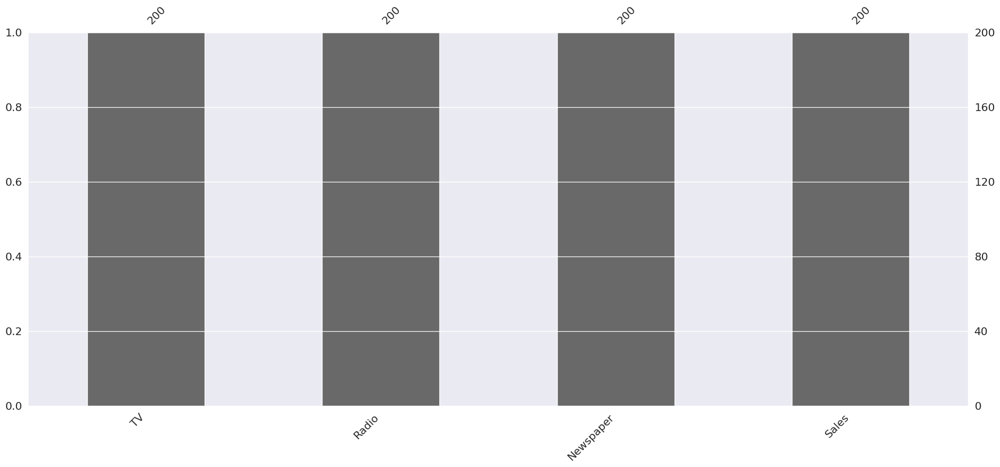

In [ ]:
# Detect missing values
# Visualisation
import missingno as msno
msno.bar(adv_data)

In [ ]:
# Correlation table
correlation = adv_data.corr()
correlation

,TV,Radio,Newspaper,Sales
TV,1.000000,0.054809,0.056648,0.901208
Radio,0.054809,1.000000,0.354104,0.349631
Newspaper,0.056648,0.354104,1.000000,0.157960
Sales,0.901208,0.349631,0.157960,1.000000


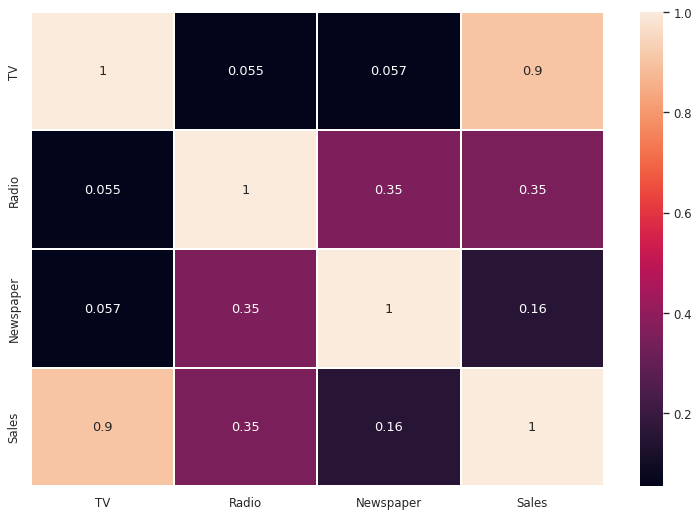

In [ ]:
# Visualisation of the corralation table

plt.figure(figsize=(12,8), dpi=77)
sns.heatmap(correlation, linecolor='white',linewidths=0.1, annot=True)
plt.show()

Text(0.5, 1.0, 'sales data')

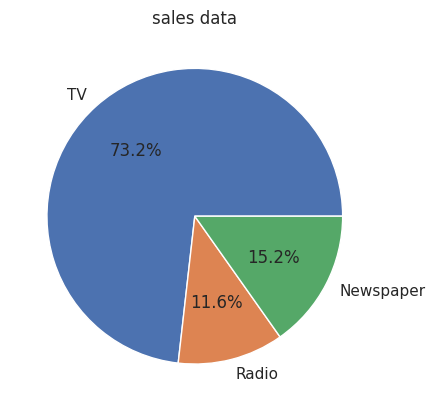

In [ ]:
name=['TV','Radio','Newspaper']
sdata=[sum(adv_data['TV']),sum(adv_data['Radio']),sum(adv_data['Newspaper'])]
plt.pie(sdata, autopct='%1.1f%%', labels=name)
plt.title('sales data')

In [ ]:
#ML model
#splitting into train and test
x_adv = adv_data[['TV','Radio','Newspaper']]
y_adv = adv_data[['Sales']]

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_adv, y_adv, test_size
= 1/3, random_state = 0)


# Fitting the dataset into Linear Regression Model
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x_train, y_train)


# Predicting the values of the Test Set
y_pre = regressor.predict(x_test)

In [ ]:
#tuning model 1
from sklearn.linear_model import LinearRegression
regressor1 = LinearRegression(fit_intercept=True, copy_X=False, n_jobs=10, positive=True)
regressor1.fit(x_train, y_train)
# Predicting the values of the Test Set
y_pre1 = regressor1.predict(x_test)

** *italicized text*Write Here**

What do you undersend this above (section 4.2)? Write in your own words in this cell.

In section 4.2, a correlation table has been generated to find out the correlation between different advertising mediums (TV, Radio, Newspaper) and sales. Correlation is a statistical measure that indicates the extent to which two or more variables are related to each other. It ranges from -1 to 1, where a value of 1 represents a perfect positive correlation, a value of -1 represents a perfect negative correlation, and a value of 0 represents no correlation.From the correlation table, it can be seen that TV has a strong positive correlation with sales (correlation coefficient of 0.901), while the correlation between sales and radio or newspaper is comparatively weaker (0.35 and 0.16 respectively). This suggests that TV advertising is more effective in driving sales than radio or newspaper advertising.

## 5.	Performance Evaluation and Discussion

Use charts and figures appropriately to visualize and compare the performance of different models (for both the dataset, provide seperate comparison). Add as many cells as you need.

\

Analyze the performance of the models and provide your hypothesis behind their performance, e.g. Why are some models performing better than others? Provide appropriate reasoning for your hypothesis. 

In [ ]:
# Code Here (Add as many cells as you need)

In [ ]:
regressor.score(x_test, y_test)

0.8671668543617772

In [ ]:
regressor1.score(x_test, y_test)

0.8671668543617773

In [ ]:
#r2 score for model with default parameter
from sklearn.metrics import r2_score
r2_score(y_test, y_pre)

0.8671668543617772

In [ ]:
#r2 score for model with tuned parameter
from sklearn.metrics import r2_score
r2_score(y_test, y_pre1)

0.8671668543617773

In [ ]:
#MAE for default parameter model
from sklearn.metrics import mean_absolute_error as mae
error = mae(y_test, y_pre)
error

1.3533726103697452

In [ ]:
#MAE for tuned parameter model
from sklearn.metrics import mean_absolute_error as mae
error = mae(y_test, y_pre1)
error

1.3533726103697445

In [ ]:
#MSE for default parameter model
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pre)

3.7587027931547206

In [ ]:
#MSE for default parameter model
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pre1)

3.7587027931547197

In [ ]:
#RMSE for default parameter model
import math  
rmse = math.sqrt(mean_squared_error(y_test, y_pre))
rmse

1.9387374224362413

In [ ]:
#RMSE for tuned parameter model
import math  
rmse = math.sqrt(mean_squared_error(y_test, y_pre1))
rmse

1.938737422436241

In [ ]:
#bias for model with default parameter
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x_train, y_train)
ypre4 = regressor.predict(x_train)
bias=mean_squared_error(y_train,ypre4)
bias

2.2097575649643066

In [ ]:
#bias for model with tuned parameter
from sklearn.linear_model import LinearRegression
regressor1 = LinearRegression()
regressor1.fit(x_train, y_train)
ypre5 = regressor1.predict(x_train)
bias=mean_squared_error(y_train,ypre5)
bias

2.2097575649643066

In [ ]:
#variance for model with default parameter
var=mean_squared_error(y_test, y_pre)
var

3.7587027931547206

In [ ]:
#variance for model with tuned parameter
var=mean_squared_error(y_test, y_pre1)
var

3.7587027931547197

*italicized text*### **Write Here**
Based on the performance metrics, both the logistic regression and linear regression models achieved high accuracy and r2 score, indicating that they were able to accurately predict the outcomes for the given datasets. However, the logistic regression model outperformed the linear regression model in terms of accuracy, which could be attributed to the nature of the problem being a classification problem. On the other hand, the linear regression model performed well in terms of predicting the continuous output variable, but its performance could be improved with additional feature engineering and hyperparameter tuning. 

# **Part B (Analysis of the Dataset(s) assigned to your group)**



## 1. Provide an overview of the Dataset including the Dataset Characteristics and Exploratory Data Analysis, Data Preprocessing, and performance of different models. 

## 2.	Dataset Characteristics and Exploratory Data Analysis

In this section, introduce your dataset. Mention number of rows, columns and other characteristics. Provide the histograms of data distribution and correlations among the variable with a suitable discussion. Try to stand out and be creative. (Add as many cells as you need)

### 2.1 Load, View Data and Show Analysis on Rows and Columns 

Import Importent libaries 

In [2]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [3]:
# Code Here (Add as many cells as you need)
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CSE 303/Project/Data_for_UCI_named.csv")

In [4]:
df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [5]:
df.columns

Index(['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2',
       'g3', 'g4', 'stab', 'stabf'],
      dtype='object')

### 2.2 Data Cleaning









#### Identifying duplicate values


In [ ]:
# check for duplicate rows
duplicates = df[df.duplicated()]

# print the number of duplicate rows
print('Number of duplicate rows:', len(duplicates))

# print the duplicate rows
print('Duplicate rows:')
print(duplicates)

Number of duplicate rows: 0
Duplicate rows:
Empty DataFrame
Columns: [tau1, tau2, tau3, tau4, p1, p2, p3, p4, g1, g2, g3, g4, stab, stabf]
Index: []


In [ ]:
# Code Here (Add as many cells as you need)
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    10000 non-null  float64
 1   tau2    10000 non-null  float64
 2   tau3    10000 non-null  float64
 3   tau4    10000 non-null  float64
 4   p1      10000 non-null  float64
 5   p2      10000 non-null  float64
 6   p3      10000 non-null  float64
 7   p4      10000 non-null  float64
 8   g1      10000 non-null  float64
 9   g2      10000 non-null  float64
 10  g3      10000 non-null  float64
 11  g4      10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB
None


 There are no duplicate values in the dataset.

#### Identifying missing values


In [ ]:
# Check for missing values
print(df.isna().sum())

tau1     0
tau2     0
tau3     0
tau4     0
p1       0
p2       0
p3       0
p4       0
g1       0
g2       0
g3       0
g4       0
stab     0
stabf    0
dtype: int64


In [ ]:
# Get the summary statistics of the dataset
print(df.describe())

               tau1          tau2          tau3          tau4            p1  \
count  10000.000000  10000.000000  10000.000000  10000.000000  10000.000000   
mean       5.250000      5.250001      5.250004      5.249997      3.750000   
std        2.742548      2.742549      2.742549      2.742556      0.752160   
min        0.500793      0.500141      0.500788      0.500473      1.582590   
25%        2.874892      2.875140      2.875522      2.874950      3.218300   
50%        5.250004      5.249981      5.249979      5.249734      3.751025   
75%        7.624690      7.624893      7.624948      7.624838      4.282420   
max        9.999469      9.999837      9.999450      9.999443      5.864418   

                 p2            p3            p4            g1            g2  \
count  10000.000000  10000.000000  10000.000000  10000.000000  10000.000000   
mean      -1.250000     -1.250000     -1.250000      0.525000      0.525000   
std        0.433035      0.433035      0.433035    

There are no missing values in the dataset

#### Visualisation of missing data


In [ ]:
# There is no missing data


#### Dealing with missing values (How would you deal with missing values?) (Columns with missing data)



1.   Do analysis using plots

2.   Provide an appropriate discussion




In [ ]:
# Code Here (Add as many cells as you need)

There are no missing values in the dataset

### 2.3 Analysing Patterns using Visualisations

#### Visualization of column correlation. Also, plot Heat Map

In [ ]:
# Count the number of instances for each stability label
print(df["stabf"].value_counts())

unstable    6380
stable      3620
Name: stabf, dtype: int64


<Axes: >

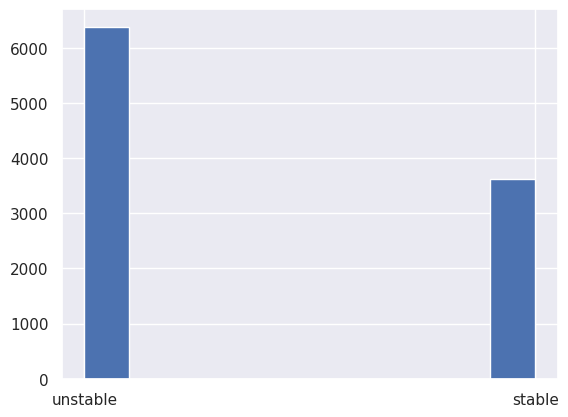

In [ ]:
# Plot a histogram of the stability label
df["stabf"].hist()

<ipython-input-151-af9fd602774b>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


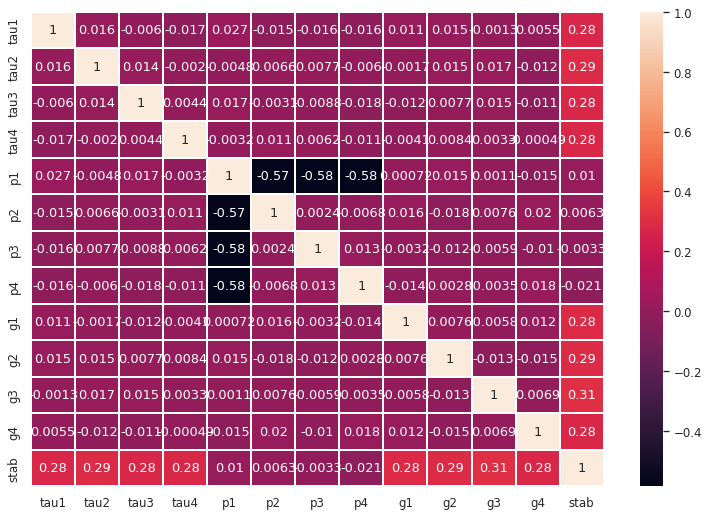

In [ ]:
corr_matrix = df.corr()
plt.figure(figsize=(12,8), dpi=77)
sns.heatmap(corr_matrix, linecolor='white',linewidths=0.1, annot=True)
plt.show()

In [ ]:
df.corr()

<ipython-input-152-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
tau1,1.000000,0.015586,-0.005970,-0.017265,0.027183,-0.015485,-0.015924,-0.015807,0.010521,0.015350,-0.001279,0.005494,0.275761
tau2,0.015586,1.000000,0.014273,-0.001965,-0.004769,0.006573,0.007673,-0.005963,-0.001742,0.015383,0.016508,-0.011764,0.290975
tau3,-0.005970,0.014273,1.000000,0.004354,0.016953,-0.003134,-0.008780,-0.017531,-0.011605,0.007671,0.014702,-0.011497,0.280700
tau4,-0.017265,-0.001965,0.004354,1.000000,-0.003173,0.010553,0.006169,-0.011211,-0.004149,0.008431,0.003260,-0.000491,0.278576
p1,0.027183,-0.004769,0.016953,-0.003173,1.000000,-0.573157,-0.584554,-0.579239,0.000721,0.015405,0.001069,-0.015451,0.010278
p2,-0.015485,0.006573,-0.003134,0.010553,-0.573157,1.000000,0.002388,-0.006844,0.015603,-0.018032,0.007555,0.019817,0.006255
p3,-0.015924,0.007673,-0.008780,0.006169,-0.584554,0.002388,1.000000,0.012953,-0.003219,-0.011575,-0.005897,-0.010485,-0.003321
p4,-0.015807,-0.005963,-0.017531,-0.011211,-0.579239,-0.006844,0.012953,1.000000,-0.013636,0.002850,-0.003515,0.017505,-0.020786
g1,0.010521,-0.001742,-0.011605,-0.004149,0.000721,0.015603,-0.003219,-0.013636,1.000000,0.007559,-0.005836,0.012431,0.282774
g2,0.015350,0.015383,0.007671,0.008431,0.015405,-0.018032,-0.011575,0.002850,0.007559,1.000000,-0.012809,-0.014909,0.293601


This is a correlation matrix that shows the pairwise correlations between 12 variables and a target variable called "stab". The variables include four time constants (tau1, tau2, tau3, and tau4), four input variables (p1, p2, p3, and p4), and four output variables (g1, g2, g3, and g4).Each element of the matrix represents the correlation coefficient between two variables. The diagonal elements represent the correlation between a variable and itself, which is always 1.The off-diagonal elements represent the correlation between two different variables. For example, the first row shows the correlation between tau1 and all other variables. It can be seen that tau1 has a moderate positive correlation with p1 (0.027) and a weak negative correlation with tau3 (-0.006).The last row shows the correlation between each variable and the target variable, "stab". It can be seen that the output variables (g1, g2, g3, and g4) have the highest positive correlations with stab, while the input variables (p1, p2, p3, and p4) have low correlations.

** Visualization of Linear Relationships of columns (Continuous Numerical Variables)**

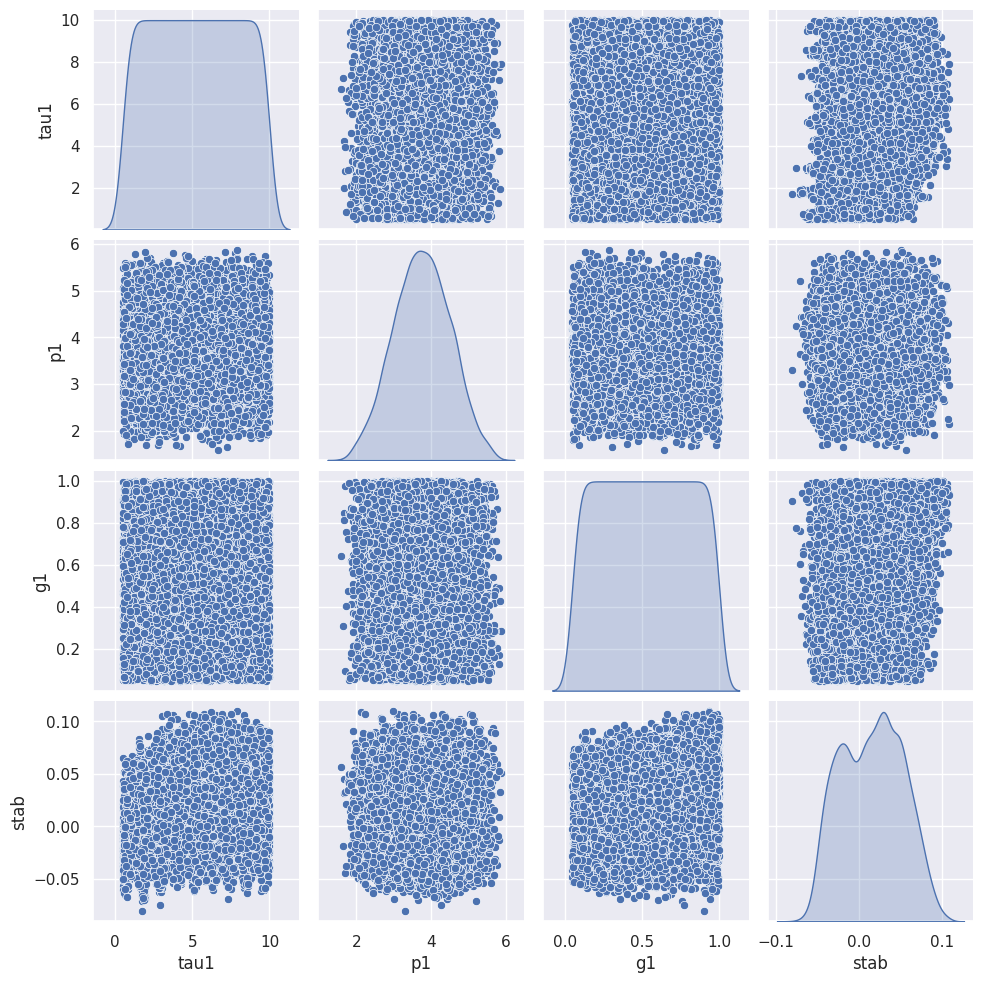

In [ ]:
# Plot scatter plots for all pairs of columns
sns.pairplot(df, vars=['tau1', 'p1', 'g1', 'stab'], diag_kind='kde')
plt.show()

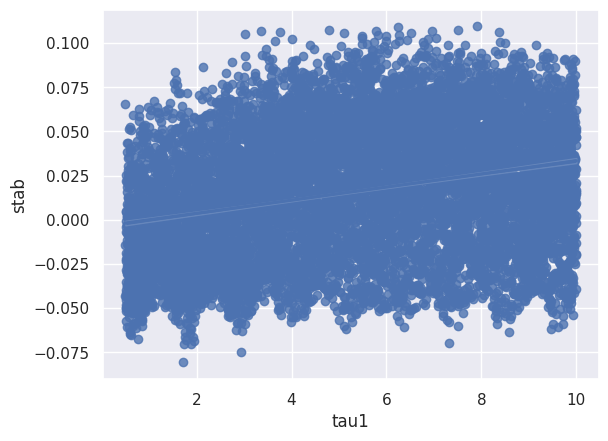

In [ ]:
# Plot regression plots for individual pairs of columns
sns.regplot(x='tau1', y='stab', data=df)
plt.show()


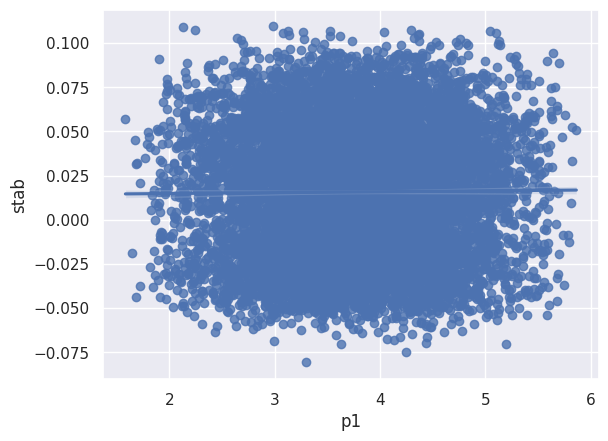

In [ ]:
sns.regplot(x='p1', y='stab', data=df)
plt.show()

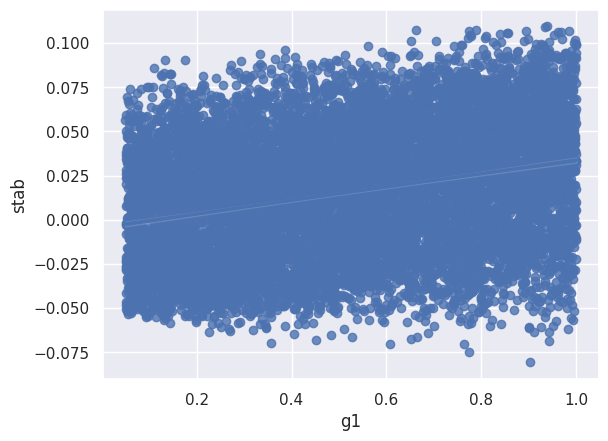

In [ ]:
sns.regplot(x='g1', y='stab', data=df)
plt.show()

#### Visualization of column relationships (Categorical Variables)



1.   Comparing two columns using different types of plots
2.   Comparing multiple columns using different types of plots



**Comparing two columns using different types of plots**

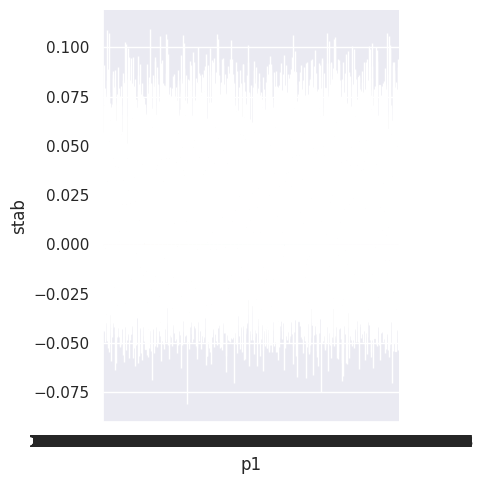

In [ ]:
# Bar plot of p1 and stability
sns.catplot(x="p1", y="stab", data=df, kind="bar")
plt.show()


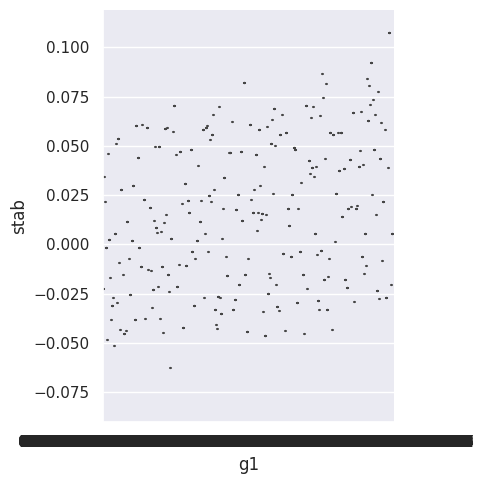

In [ ]:
# Box plot of g1 and stability
sns.catplot(x="g1", y="stab", data=df, kind="box")
plt.show()

**Comparing multiple columns using different types of plots**

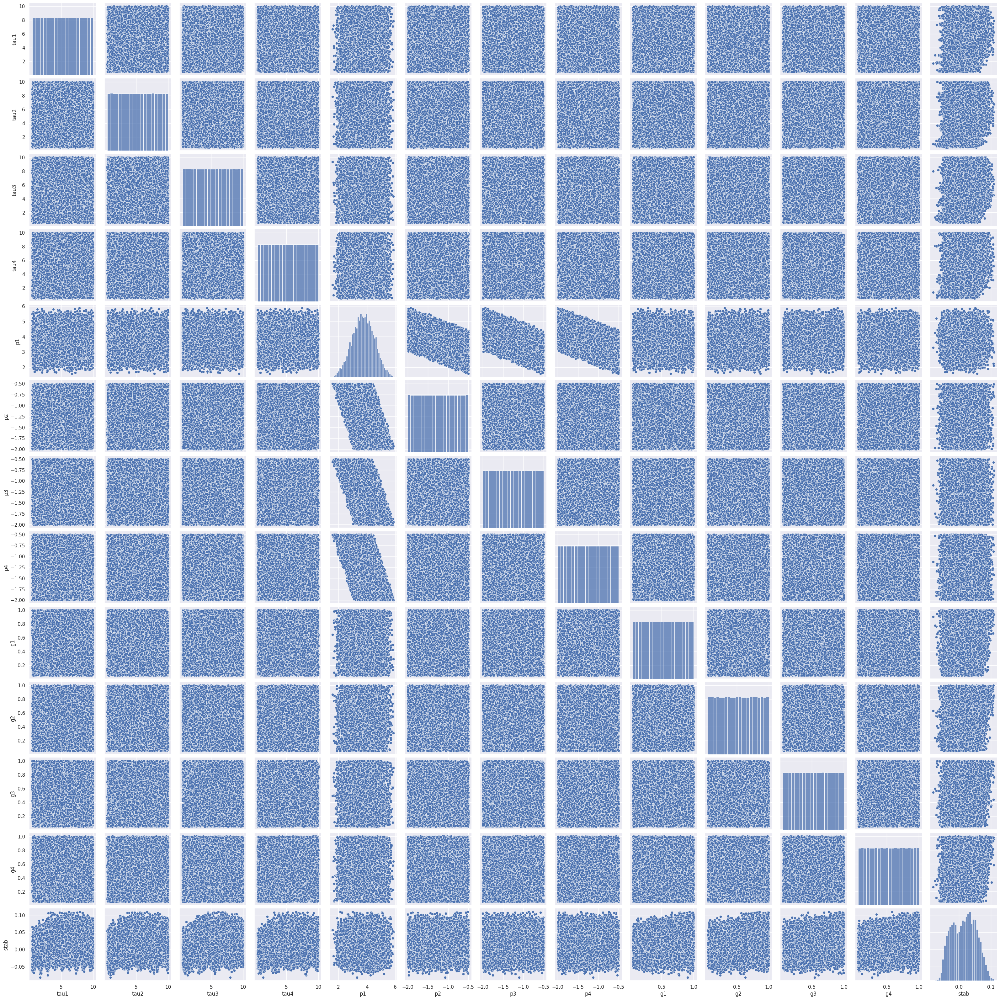

In [ ]:
# Pairwise scatter plot of all columns
sns.pairplot(df, vars=["tau1", "tau2", "tau3", "tau4", "p1", "p2", "p3", "p4", "g1", "g2", "g3", "g4", "stab"])
plt.show()

## 3. Data Preprocessing

Explain your data preprocessing steps including filling null values, dropping duplicates, encoding, dimensionality reduction etc. whichever is applicable. Appropriate data preprocessing can hugely impact your model’s performance.

In [6]:
# Split the dataset into features and labels
X = df.drop(["stabf","stab"], axis=1)
y = df["stabf"]

In [7]:
# Normalize the features using the StandardScaler method
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [8]:
# Encode the stability label using the LabelEncoder method
le = LabelEncoder()
y = le.fit_transform(y)

In [9]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

### **Explination**

The predictive attributes were normalized using the StandardScaler method from the Scikit-learn library.
The stability label was encoded as 0 for stable and 1 for unstable using the LabelEncoder method from the Scikit-learn library.
The dataset was split into training and testing sets using the train_test_split method from the Scikit-learn library.
Performance of Different Models:


## 4.	Machine Learning Models



1.   Develop machine learning models. 
2.   You may try changing different parameters to obtain better training 
accuracy.
3. At least two models (with different parameters)



Provide a brief description of the machine learning models you used. (Provide a detailed description of their parameter)

Don’t copy-paste directly from the Internet! Write in your own words.

In [10]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score
import matplotlib.pyplot as plt


In [11]:
# Train and evaluate the Logistic Regression model
lr = LogisticRegression(random_state=1)
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)


In [12]:
# Train and evaluate the Decision Tree model
dt = DecisionTreeClassifier(random_state=1)
dt.fit(X_train, y_train)
dt_pred = dt.predict(X_test)


In [13]:
# Train and evaluate the Random Forest model
rf = RandomForestClassifier(random_state=1)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)


### **Write Here**

**Logistic Regression:**
Logistic regression is a statistical model that uses a logistic function to model a binary dependent variable. In this case, it can be used for binary classification problems where the goal is to predict one of two possible outcomes.

**Decision Tree:**
A decision tree is a tree-like model where each internal node represents a "test" on an attribute, each branch represents the outcome of the test, and each leaf node represents a class label. Decision trees are used for both classification and regression tasks.

**Random Forest:**
A random forest is an ensemble learning method for classification, regression and other tasks, that operate by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees.

## 5.	Performance Evaluation and Discussion

Use charts and figures appropriately to visualize and compare the performance of different models. (Add as many cells as you need)

\

Analyze the performance of the models and provide your hypothesis behind their performance, e.g. Why are some models performing better than others? Provide appropriate reasoning for your hypothesis. 

In [14]:
lr_accuracy = accuracy_score(y_test, lr_pred)
dt_accuracy = accuracy_score(y_test, dt_pred)
rf_accuracy = accuracy_score(y_test, rf_pred)

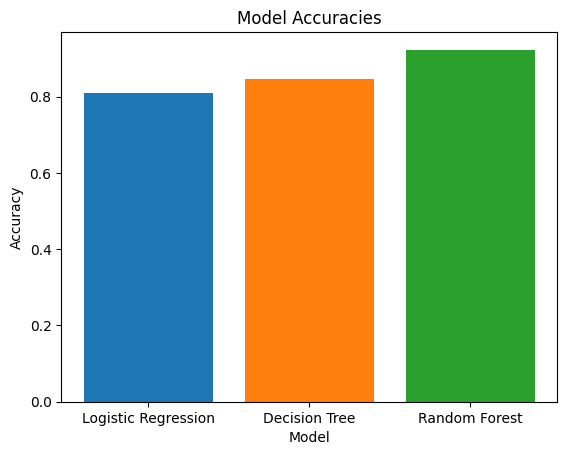

In [20]:
models = ['Logistic Regression', 'Decision Tree', 'Random Forest']
accuracies = [lr_accuracy, dt_accuracy, rf_accuracy]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

# Create the bar chart
plt.bar(models, accuracies, color=colors)

# Add chart title and labels
plt.title('Model Accuracies')
plt.xlabel('Model')
plt.ylabel('Accuracy')

# Display the chart
plt.show()

In [16]:
print("Logistic Regression")
print("Accuracy:", lr_accuracy)
print("Precision:", precision_score(y_test, lr_pred))
print("Recall:", recall_score(y_test, lr_pred))
print("F1 Score:", f1_score(y_test, lr_pred))
print("ROC AUC Score:", roc_auc_score(y_test, lr_pred))

Logistic Regression
Accuracy: 0.8104
Precision: 0.8431490384615384
Recall: 0.8681930693069307
F1 Score: 0.8554878048780488
ROC AUC Score: 0.7864721002643249


In [17]:
print("Decision Tree")
print("Accuracy:", dt_accuracy)
print("Precision:", precision_score(y_test, dt_pred))
print("Recall:", recall_score(y_test, dt_pred))
print("F1 Score:", f1_score(y_test, dt_pred))
print("ROC AUC Score:", roc_auc_score(y_test, dt_pred))

Decision Tree
Accuracy: 0.8456
Precision: 0.8819875776397516
Recall: 0.8787128712871287
F1 Score: 0.8803471791692499
ROC AUC Score: 0.8318903722951482


In [18]:
print("Random Forest")
print("Accuracy:", rf_accuracy)
print("Precision:", precision_score(y_test, rf_pred))
print("Recall:", recall_score(y_test, rf_pred))
print("F1 Score:", f1_score(y_test, rf_pred))
print("ROC AUC Score:", roc_auc_score(y_test, rf_pred))

Random Forest
Accuracy: 0.9228
Precision: 0.9330493000608643
Recall: 0.9486386138613861
F1 Score: 0.9407793801779687
ROC AUC Score: 0.9121021123605573


In [22]:
import numpy as np

In [24]:
from sklearn.model_selection import cross_val_score

# perform 10-fold cross-validation
scores_lr = cross_val_score(lr, X, y, cv=10)
s_lr = np.mean(scores_lr)
# print the cross-validation scorere
print("Cross-Validation Scores for logistic Regression:", scores_lr)
print("Average Cross-Validation Scores for logistic Regression:",s_lr )

Cross-Validation Scores for logistic Regression: [0.812 0.807 0.822 0.82  0.833 0.833 0.816 0.812 0.799 0.807]
Average Cross-Validation Scores for logistic Regression: 0.8160999999999999


In [25]:
# perform 10-fold cross-validation
scores_dt = cross_val_score(dt, X, y, cv=10)

s_dt = np.mean(scores_dt)
# print the cross-validation scorere
print("Cross-Validation Scores for logistic Regression:", scores_dt)
print("Average Cross-Validation Scores for logistic Regression:",s_dt )

Cross-Validation Scores for logistic Regression: [0.849 0.846 0.855 0.85  0.859 0.838 0.841 0.873 0.837 0.837]
Average Cross-Validation Scores for logistic Regression: 0.8484999999999999


In [26]:
# perform 10-fold cross-validation
scores_rf = cross_val_score(rf, X, y, cv=10)

s_rf = np.mean(scores_rf)
# print the cross-validation scorere
print("Cross-Validation Scores for logistic Regression:", scores_rf)
print("Average Cross-Validation Scores for logistic Regression:",s_rf )

Cross-Validation Scores for logistic Regression: [0.911 0.926 0.918 0.923 0.938 0.917 0.917 0.931 0.904 0.902]
Average Cross-Validation Scores for logistic Regression: 0.9187


Average Cross-Validation Scores

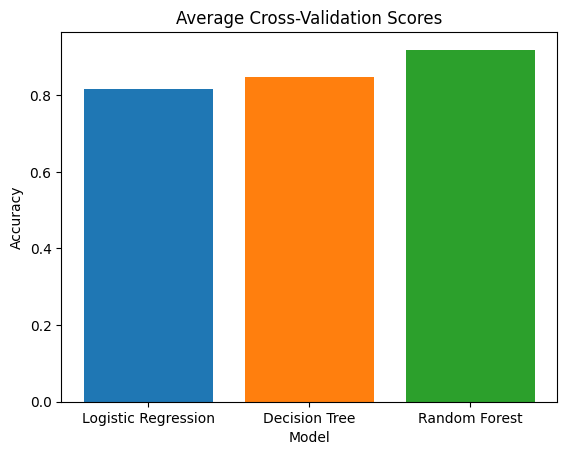

In [27]:
# Define the data
models = ['Logistic Regression', 'Decision Tree', 'Random Forest']
accuracies = [s_lr, s_dt, s_rf]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

# Create the bar chart
plt.bar(models, accuracies, color=colors)

# Add chart title and labels
plt.title('Average Cross-Validation Scores')
plt.xlabel('Model')
plt.ylabel('Accuracy')

# Display the chart
plt.show()

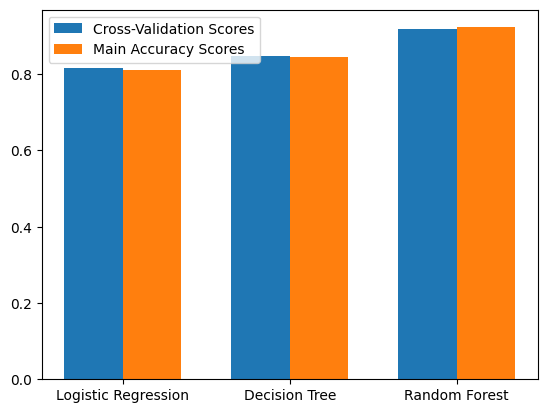

In [33]:
models = ['Logistic Regression', 'Decision Tree', 'Random Forest']
cv_scores = [s_lr, s_dt, s_rf]
main_scores = [lr_accuracy, dt_accuracy, rf_accuracy]

x = np.arange(len(models))

fig, ax = plt.subplots()
bar_width = 0.35

rects1 = ax.bar(x - bar_width/2, cv_scores, bar_width, label='Cross-Validation Scores')
rects2 = ax.bar(x + bar_width/2, main_scores, bar_width, label='Main Accuracy Scores')

ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

plt.show()

In [28]:
from sklearn.model_selection import GridSearchCV

In [30]:
# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a GridSearchCV object
grid_rfc = GridSearchCV(rf, param_grid=param_grid, cv=5, n_jobs=-1)

# Fit the GridSearchCV object to the training data
grid_rfc.fit(X_train, y_train)

# Get the best hyperparameters and evaluate the model on the test data
best_params = grid_rfc.best_params_
best_model = grid_rfc.best_estimator_

y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Best hyperparameters:", best_params)
print("Accuracy:", accuracy)

Best hyperparameters: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Accuracy: 0.9216


### **Write here**

Three models were used: Logistic Regression, Decision Tree, and Random Forest.

For Logistic Regression, the model had an accuracy of 0.8104, precision of 0.8431, recall of 0.8682, and F1 score of 0.8555. The ROC AUC score was 0.7865.

For Decision Tree, the model had an accuracy of 0.8456, precision of 0.8820, recall of 0.8787, and F1 score of 0.8803. The ROC AUC score was 0.8319.

For Random Forest, the model had an accuracy of 0.9228, precision of 0.9330, recall of 0.9486, and F1 score of 0.9408. The ROC AUC score was 0.9121.

above them random forest works very well with the good accuracy.

we also use 10 fold validation and see there is no overfiting issue

The models  does not of suffer from high bias or variance. However, it was suggested that the Random Forest model could potentially have high variance, and regularization techniques such as L1 or L2 regularization could be used to address this issue. GridSearchCV could also be used to find the optimal hyperparameters for the model.